In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from my_functions_for_ml import *

In [2]:
pd.set_option("display.max_columns",None)

In [3]:
# Load data
ddos = pd.read_csv("MachineLearningCVE/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv")
benign = pd.read_csv("MachineLearningCVE/Monday-WorkingHours.pcap_ISCX.csv")

In [4]:
# Combine
# df = pd.concat([ddos, benign])
df = ddos[:]

In [5]:
# Clean the column name first
df.columns = df.columns.str.strip()

In [6]:
print("Dos",ddos[" Label"].value_counts())
print("Benign",benign[" Label"].value_counts())
print("Combine",df["Label"].value_counts())

Dos  Label
DDoS      128027
BENIGN     97718
Name: count, dtype: int64
Benign  Label
BENIGN    529918
Name: count, dtype: int64
Combine Label
DDoS      128027
BENIGN     97718
Name: count, dtype: int64


In [7]:
# Get total number of rows
total = len(df)

# Get label counts and percentages
label_counts = df["Label"].value_counts()
label_percentages = (label_counts / total) * 100

# Display counts and percentages
print("Label Counts:\n", label_counts)
print("\nLabel Percentages (%):\n", label_percentages.round(2))

Label Counts:
 Label
DDoS      128027
BENIGN     97718
Name: count, dtype: int64

Label Percentages (%):
 Label
DDoS      56.71
BENIGN    43.29
Name: count, dtype: float64


In [8]:
df.shape

(225745, 79)

In [9]:
df.sample(20)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
86147,80,200204,1,1,6,6,6,6,6.000000,0.000000,6,6,6.000000,0.000000,5.993886e+01,9.989810,2.002040e+05,0.000000e+00,200204,200204,0,0.000000e+00,0.000000e+00,0,0,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,20,20,4.994905,4.994905,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,1,9.000000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,1,6,245,137,0,20,0.0,0.000,0,0,0.0,0.000000e+00,0,0,BENIGN
122656,80,8062821,6,0,36,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,4.464939e+00,0.744156,1.612564e+06,3.604105e+06,8059783,1,8062821,1.612564e+06,3.604105e+06,8059783,1,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,120,0,0.744156,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,0,0,0,0,7.000000,6.000000,0.000000,120,0,0,0,0,0,0,6,36,0,0,256,-1,5,20,3038.0,0.000,3038,3038,8059783.0,0.000000e+00,8059783,8059783,DDoS
4327,443,16908488,8,8,1205,1198,601,0,150.625000,254.826517,1017,0,149.750000,354.229445,1.421180e+02,0.946270,1.127233e+06,2.875352e+06,9999952,4,10900000,1.558284e+06,3.723208e+06,9999952,39567,16800000,2.398921e+06,4.019970e+06,10100000,4,0,0,0,0,264,264,0.473135,0.473135,0,1017,141.352941,290.918576,8.463362e+04,0,0,0,1,0,0,0,0,1,150.187500,150.625000,149.750000,264,0,0,0,0,0,0,8,1205,8,1198,29200,124,3,32,511852.0,560288.786,908036,115668,7942390.0,2.909832e+06,9999952,5884828,BENIGN
120314,52844,86279085,6,9,11613,62,7300,0,1935.500000,3138.795040,20,0,6.888889,5.301991,1.353167e+02,0.173854,6.162792e+06,2.030000e+07,75900000,1,86300000,1.730000e+07,3.860000e+07,86200000,3,86200000,1.080000e+07,2.660000e+07,75900000,1,0,0,0,0,132,192,0.069542,0.104313,0,7300,730.062500,2052.802328,4.213997e+06,0,0,0,0,1,1,0,0,1,778.733333,1935.500000,6.888889,132,0,0,0,0,0,0,6,11613,9,62,229,256,4,20,36181.0,0.000,36181,36181,43100000.0,4.640000e+07,75900000,10300000,BENIGN
52205,55077,4651575,1,6,6,36,6,6,6.000000,0.000000,6,6,6.000000,0.000000,9.029200e+00,1.504867,7.752625e+05,1.885923e+06,4624868,3,0,0.000000e+00,0.000000e+00,0,0,4637880,9.275760e+05,2.066854e+06,4624868,3,0,0,0,0,20,120,0.214981,1.289886,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,6,6.857143,6.000000,6.000000,20,0,0,0,0,0,0,1,6,6,36,229,0,0,20,0.0,0.000,0,0,0.0,0.000000e+00,0,0,BENIGN
62811,80,61982,3,4,26,11601,20,0,8.666667,10.263203,7300,0,2900.250000,3563.297197,1.875867e+05,112.936014,1.033033e+04,1.758349e+04,43588,104,17999,8.999500e+03,1.130169e+04,16991,1008,61878,2.062600e+04,2.180940e+04,43588,189,0,0,0,0,72,92,48.401149,64.534865,0,7300,1453.375000,2798.956588,7.834158e+06,0,0,0,1,0,0,0,0,1,1661.000000,8.666667,2900.250000,72,0,0,0,0,0,0,3,26,4,11601,8192,229,2,20,0.0,0.000,0,0,0.0,0.000000e+00,0,0,DDoS
165620,58750,10129372,1,6,6,36,6,6,6.000000,0.000000,6,6,6.000000,0.00

In [10]:
columns = df.columns
columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225745 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Destination Port             225745 non-null  int64  
 1   Flow Duration                225745 non-null  int64  
 2   Total Fwd Packets            225745 non-null  int64  
 3   Total Backward Packets       225745 non-null  int64  
 4   Total Length of Fwd Packets  225745 non-null  int64  
 5   Total Length of Bwd Packets  225745 non-null  int64  
 6   Fwd Packet Length Max        225745 non-null  int64  
 7   Fwd Packet Length Min        225745 non-null  int64  
 8   Fwd Packet Length Mean       225745 non-null  float64
 9   Fwd Packet Length Std        225745 non-null  float64
 10  Bwd Packet Length Max        225745 non-null  int64  
 11  Bwd Packet Length Min        225745 non-null  int64  
 12  Bwd Packet Length Mean       225745 non-null  float64
 13 

In [14]:
#missing values
missing_percentage(df)

In [13]:
# Replace common missing values
missing_values = [-1, 'NaN', 'nan', '', ' ']
df.replace(missing_values, np.nan, inplace=True)
# Drop rows with missing or infinite values
df.replace([np.inf, -np.inf], 0, inplace=True)
df.replace(-1, 0, inplace=True)
# Replace -1 with NaN in these
df[['Init_Win_bytes_forward', 'Init_Win_bytes_backward']] = df[['Init_Win_bytes_forward', 'Init_Win_bytes_backward']].replace(-1, np.nan)
df.dropna(inplace=True)

In [15]:
df.sample(20)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
41008,80,90892.0,1,1,6,6,6,6,6.000000,0.000000,6,6,6.000000,0.000000,1.320248e+02,2.200414e+01,9.089200e+04,0.000000e+00,90892.0,90892.0,0,0.000000e+00,0.000000e+00,0,0.0,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,20,20,11.002068,11.002068,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,1,9.000000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,1,6,32160.0,20178.0,0,20,0.000000e+00,0.0000,0,0,0.0,0.000000e+00,0,0,BENIGN
130035,443,1.0,1,1,6,6,6,6,6.000000,0.000000,6,6,6.000000,0.000000,1.200000e+07,2.000000e+06,1.000000e+00,0.000000e+00,1.0,1.0,0,0.000000e+00,0.000000e+00,0,0.0,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,20,20,1000000.000000,1000000.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,0,0,0,1,9.000000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,1,6,16329.0,31.0,0,20,0.000000e+00,0.0000,0,0,0.0,0.000000e+00,0,0,BENIGN
89961,80,595373.0,3,5,26,11601,20,0,8.666667,10.263203,5840,0,2320.200000,2436.833027,1.952893e+04,1.343695e+01,8.505329e+04,2.111609e+05,563181.0,20.0,31762,1.588100e+04,2.227104e+04,31629,133.0,595353,1.488382e+05,2.766308e+05,563181,164,0,0,0,0,72,112,5.038858,8.398097,0,5840,1291.888889,2110.950760,4.456113e+06,0,0,0,1,0,0,0,0,1,1453.375000,8.666667,2320.200000,72,0,0,0,0,0,0,3,26,5,11601,8192.0,229.0,2,20,0.000000e+00,0.0000,0,0,0.0,0.000000e+00,0,0,DDoS
59993,55129,2645515.0,1,6,6,36,6,6,6.000000,0.000000,6,6,6.000000,0.000000,1.587593e+01,2.645988e+00,4.409192e+05,1.071387e+06,2627865.0,3.0,0,0.000000e+00,0.000000e+00,0,0.0,2635885,5.271770e+05,1.174323e+06,2627865,3,0,0,0,0,20,120,0.377998,2.267989,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,6,6.857143,6.000000,6.000000,20,0,0,0,0,0,0,1,6,6,36,229.0,0.0,0,20,0.000000e+00,0.0000,0,0,0.0,0.000000e+00,0,0,BENIGN
197692,80,115925362.0,18,15,1154,500,577,0,64.111111,186.590741,250,0,33.333333,87.966444,1.426780e+01,2.846659e-01,3.622668e+06,4.851257e+06,10200000.0,55.0,116000000,6.819139e+06,4.788010e+06,10200000,36475.0,113000000,8.053138e+06,4.296754e+06,10200000,18551,0,0,0,0,584,488,0.155272,0.129394,0,577,48.647059,146.721315,2.152714e+04,0,0,0,1,0,0,0,0,0,50.121212,64.111111,33.333333,584,0,0,0,0,0,0,18,1154,15,500,29200.0,350.0,2,32,7.133064e+04,113818.7524,414461,36267,10200000.0,5.817341e+04,10200000,10000000,BENIGN
28351,80,72027778.0,8,5,56,11607,20,0,7.000000,5.656854,10220,0,2321.400000,4455.182578,1.619236e+02,1.804859e-01,6.002315e+06,1.830000e+07,63700000.0,4.0,70500000,1.010000e+07,2.380000e+07,63700000,4.0,1509603,3.774008e+05,7.541036e+05,1508556,92,0,0,0,0,172,112,0.111068,0.069418,0,10220,833.500000,2726.136143,7.431818e+06,0,0,0,0,1,0,0,0,0,897.615385,7.000000,2321.400000,172,0,0,0,0,0,0,8,56,5,11607,256.0,229.0,6,20,6.018000e+03,0.0000,6018,6018,353000

In [16]:
def cat_value_count(df_new):
    import pandas as pd
    categorical_cols = df_new.columns  # Select categorical columns
    for col in categorical_cols:
        print(f"Value counts for column: {col}\n")
        print(df_new[col].value_counts(), "\n" + "-"*40 + "\n")  # Display counts for each unique value
    categorical_cols = df.columns  # Select categorical columns
    return categorical_cols

In [17]:
cat_value_count(df)

Value counts for column: Destination Port

Destination Port
80       88088
443      11203
22         340
8080       194
389        165
         ...  
64191        1
25372        1
25401        1
25396        1
61326        1
Name: count, Length: 22656, dtype: int64 
----------------------------------------

Value counts for column: Flow Duration

Flow Duration
53.0          99
51.0          89
50.0          83
54.0          79
49.0          77
              ..
80207404.0     1
1775865.0      1
80208009.0     1
1775682.0      1
906.0          1
Name: count, Length: 128594, dtype: int64 
----------------------------------------

Value counts for column: Total Fwd Packets

Total Fwd Packets
3      60198
1      23094
8      19785
6       6466
7       6253
       ...  
443        1
511        1
560        1
348        1
189        1
Name: count, Length: 274, dtype: int64 
----------------------------------------

Value counts for column: Total Backward Packets

Total Backward Packets
5     

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [18]:
#Remove columns contain same/0 value for all rows
columns_to_drop = [
    'Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
    'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate',
    'CWE Flag Count', 'Bwd URG Flags', 'Fwd URG Flags', 'Bwd PSH Flags',
    'Fwd Header Length.1'
]

In [19]:
df.drop(columns=columns_to_drop, inplace=True)

In [20]:
# Step 4 (optional): Reset index
df.reset_index(drop=True, inplace=True)

In [21]:
df.shape

(137341, 68)

In [22]:
# Get total number of rows
total = len(df)

# Get label counts and percentages
label_counts = df["Label"].value_counts()
label_percentages = (label_counts / total) * 100

# Display counts and percentages
print("Label Counts:\n", label_counts)
print("\nLabel Percentages (%):\n", label_percentages.round(2))

Label Counts:
 Label
DDoS      81481
BENIGN    55860
Name: count, dtype: int64

Label Percentages (%):
 Label
DDoS      59.33
BENIGN    40.67
Name: count, dtype: float64


In [23]:
from sklearn.preprocessing import LabelEncoder

# Separate X and y
X = df.drop(columns=['Label'])
y = df['Label']

# Encode label if not already
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Check mapping (e.g., {'BENIGN': 0, 'DDoS': 1})
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label Mapping:", label_mapping)

Label Mapping: {'BENIGN': 0, 'DDoS': 1}


# check distribution and outlier

In [24]:
#plot multiple plot in one functions
def All_plot(X):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from scipy import stats
    col = X.columns
    for column in col:
        if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
            fig, axes = plt.subplots(1, 3, figsize=(21, 6))  # 3 plots in a row

            skewness = X[column].skew()

            # Determine skewness type
            if skewness > 0:
                skew_type = "Positive Skewness"
            elif skewness < 0:
                skew_type = "Negative Skewness"
            else:
                skew_type = "Approximately Symmetrical"

            print(f"{column}: Skewness = {skewness:.2f} ({skew_type})")

            # KDE plot
            sns.kdeplot(X[column].dropna(), fill=True, color='blue', alpha=0.5, ax=axes[0])
            axes[0].set_title(f"KDE Plot for {column}\n(Skewness: {skewness:.2f}) ({skew_type})", fontsize=12)
            axes[0].set_xlabel(column)
            axes[0].set_ylabel('Density')
            axes[0].grid(alpha=0.3)

            # Q-Q plot
            stats.probplot(X[column].dropna(), dist="norm", plot=axes[1])
            axes[1].set_title(f"Q-Q Plot for {column}", fontsize=12)

            # Boxplot
            sns.boxplot(x=X[column], ax=axes[2])
            axes[2].set_title(f"Boxplot for {column}", fontsize=12)
            axes[2].set_xlabel(column)

            plt.tight_layout()
            plt.show()


Destination Port: Skewness = 1.31 (Positive Skewness)


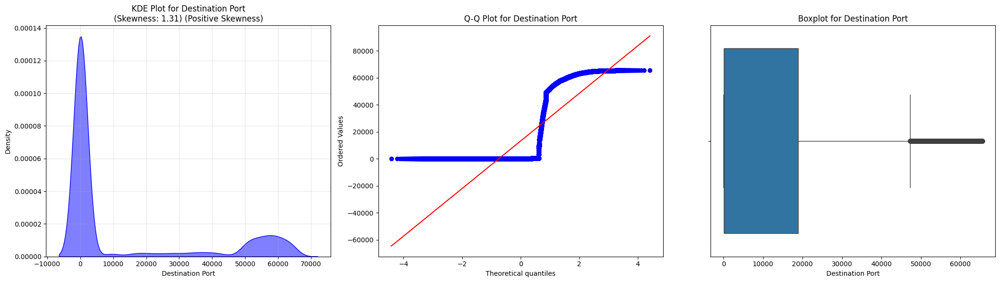

Flow Duration: Skewness = 1.21 (Positive Skewness)


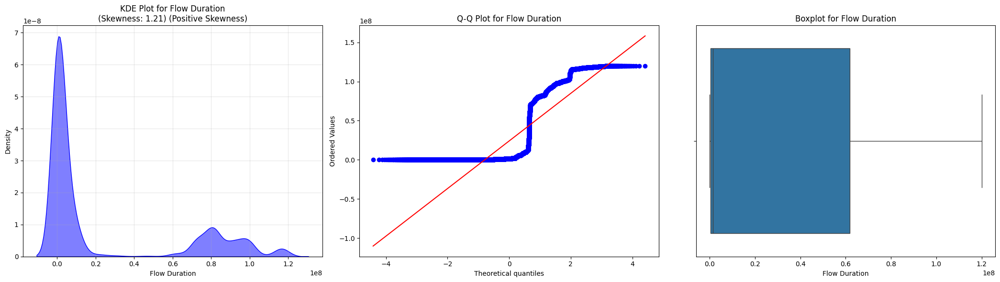

Total Fwd Packets: Skewness = 49.03 (Positive Skewness)


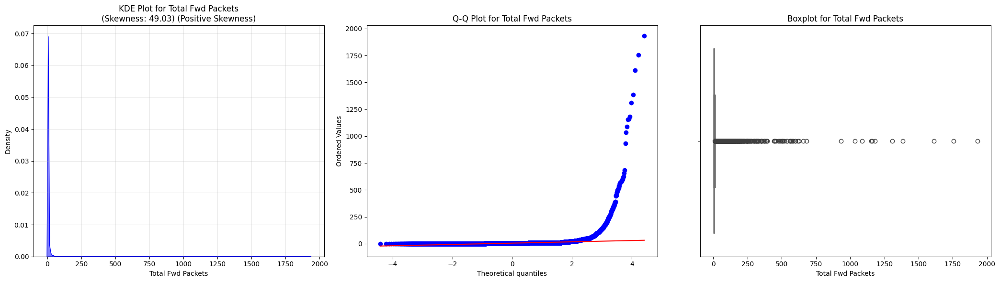

Total Backward Packets: Skewness = 49.48 (Positive Skewness)


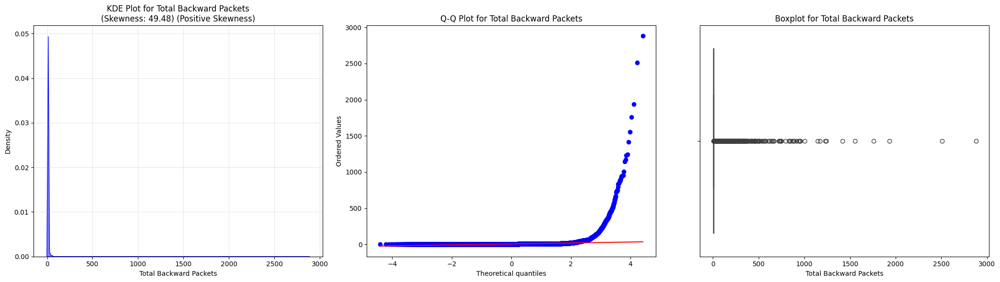

Total Length of Fwd Packets: Skewness = 5.39 (Positive Skewness)


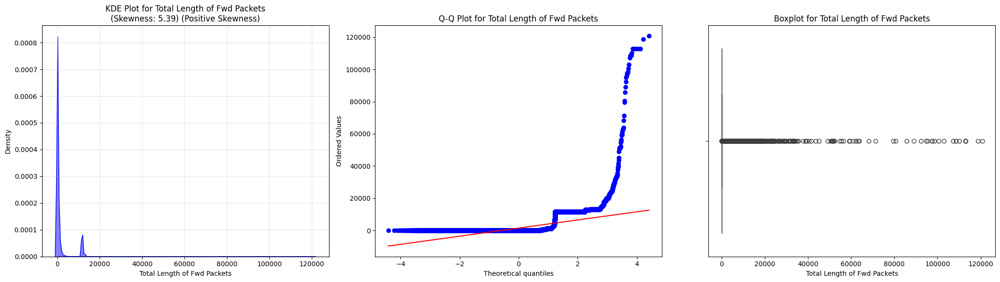

Total Length of Bwd Packets: Skewness = 55.91 (Positive Skewness)


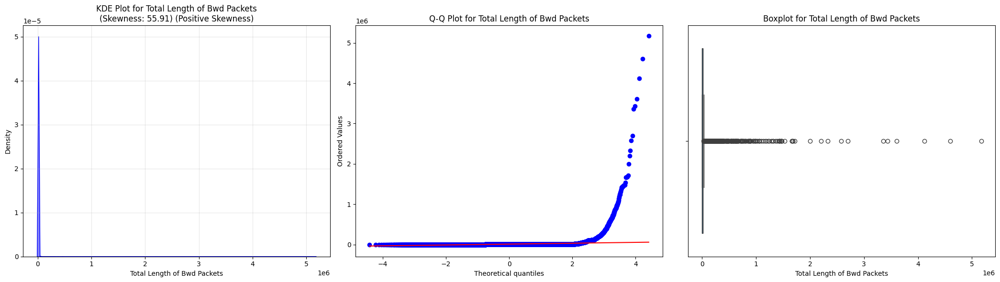

Fwd Packet Length Max: Skewness = 3.02 (Positive Skewness)


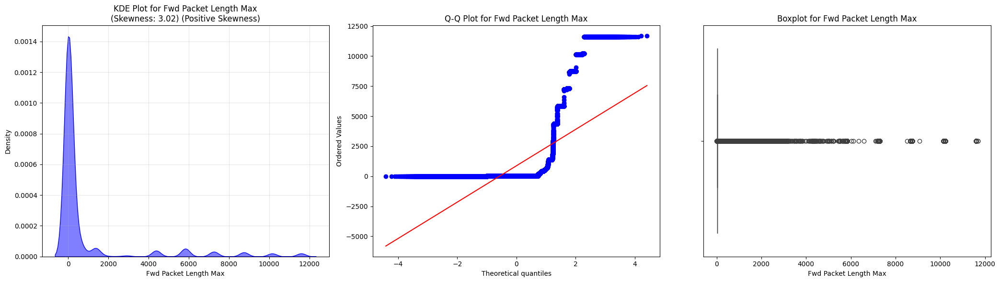

Fwd Packet Length Min: Skewness = 6.28 (Positive Skewness)


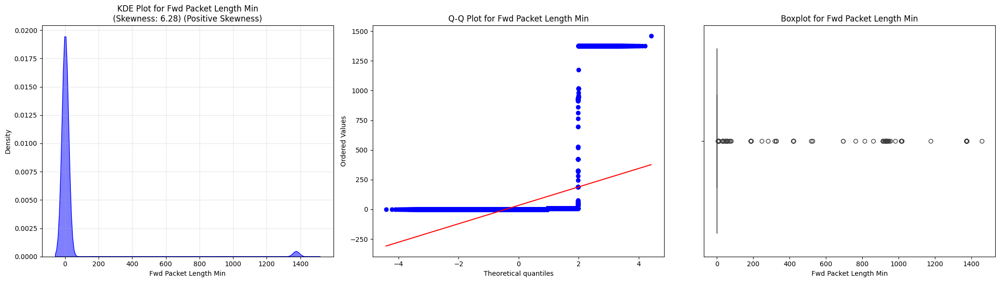

Fwd Packet Length Mean: Skewness = 2.38 (Positive Skewness)


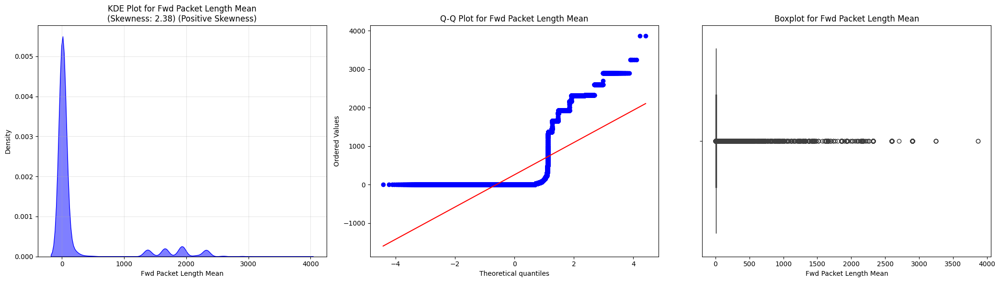

Fwd Packet Length Std: Skewness = 3.14 (Positive Skewness)


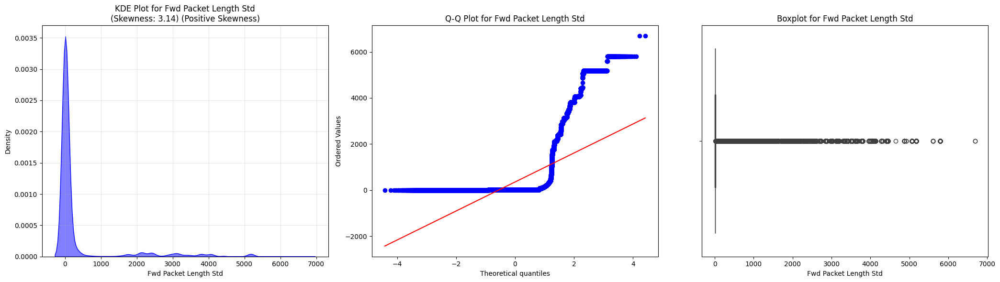

Bwd Packet Length Max: Skewness = 0.24 (Positive Skewness)


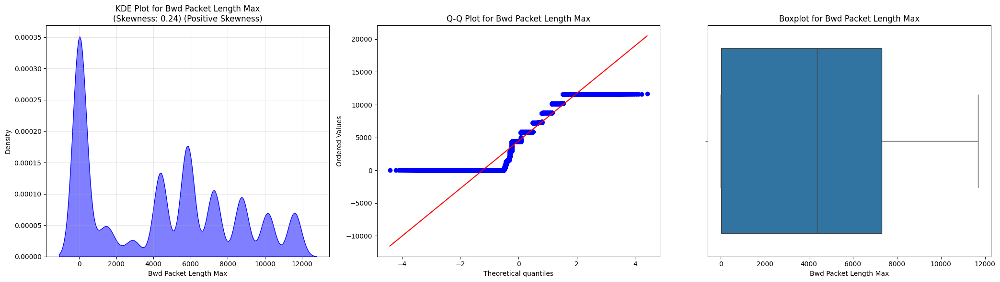

Bwd Packet Length Min: Skewness = 41.00 (Positive Skewness)


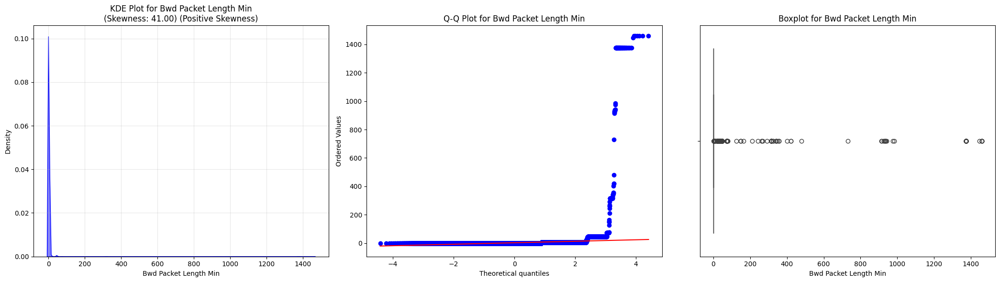

Bwd Packet Length Mean: Skewness = -0.22 (Negative Skewness)


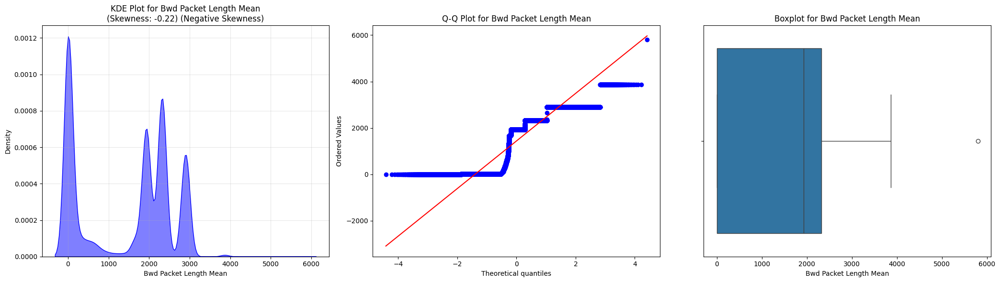

Bwd Packet Length Std: Skewness = 0.42 (Positive Skewness)


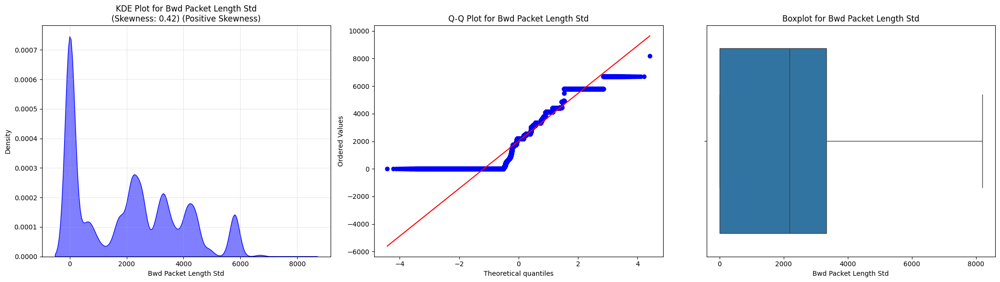

Flow Bytes/s: Skewness = 159.48 (Positive Skewness)


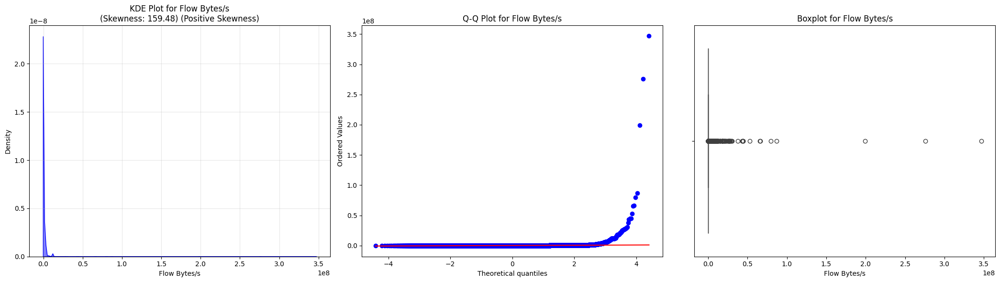

Flow Packets/s: Skewness = 38.82 (Positive Skewness)


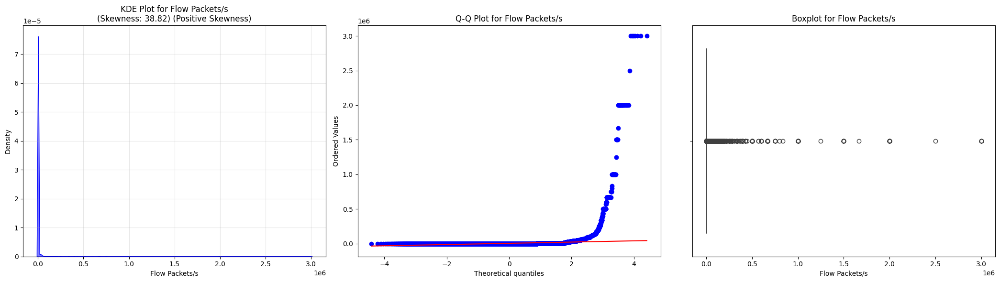

Flow IAT Mean: Skewness = 1.31 (Positive Skewness)


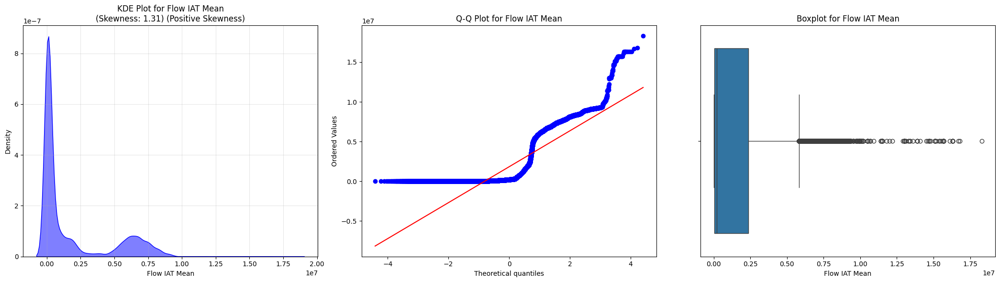

Flow IAT Std: Skewness = 1.35 (Positive Skewness)


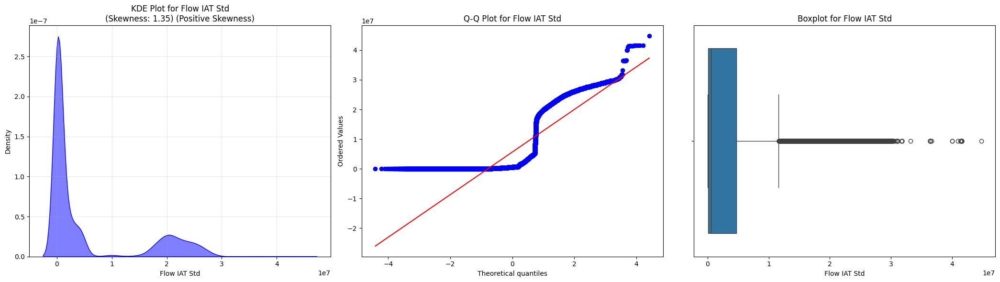

Flow IAT Max: Skewness = 1.35 (Positive Skewness)


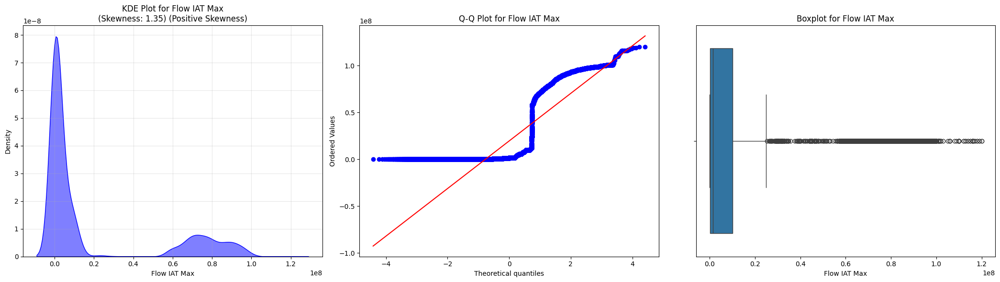

Flow IAT Min: Skewness = 86.18 (Positive Skewness)


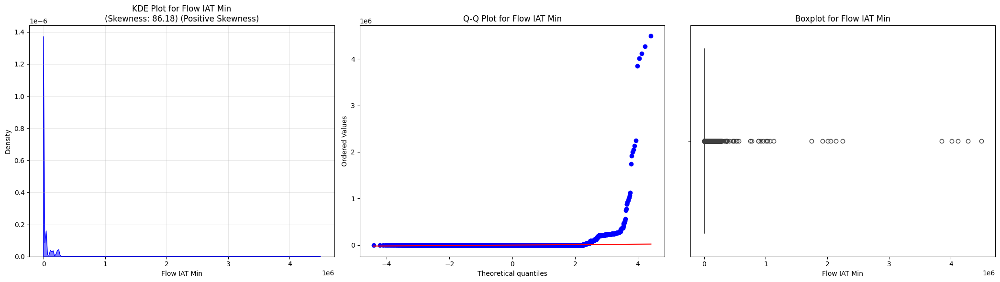

Fwd IAT Total: Skewness = 1.23 (Positive Skewness)


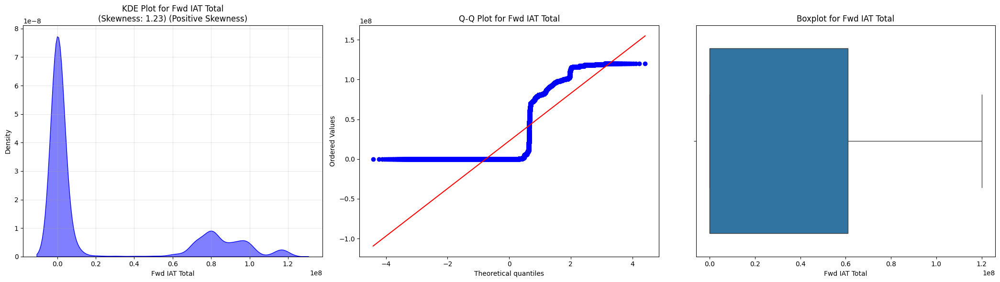

Fwd IAT Mean: Skewness = 1.57 (Positive Skewness)


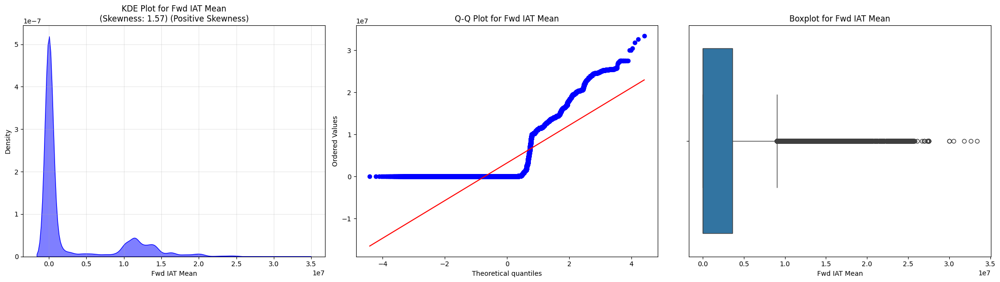

Fwd IAT Std: Skewness = 1.46 (Positive Skewness)


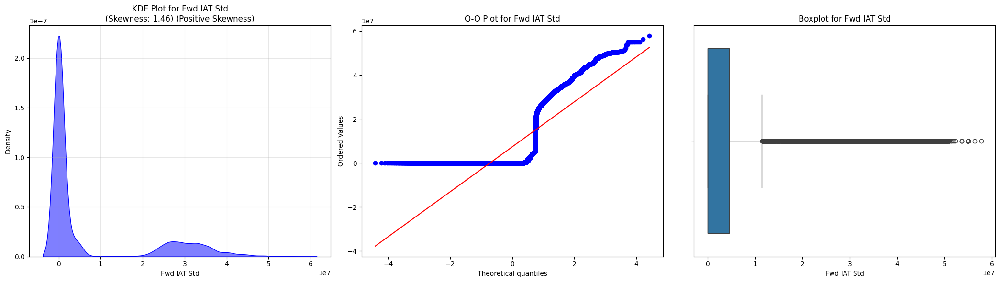

Fwd IAT Max: Skewness = 1.37 (Positive Skewness)


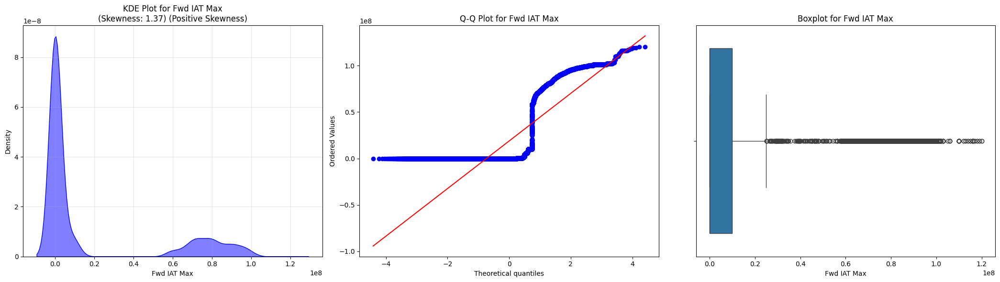

Fwd IAT Min: Skewness = 38.71 (Positive Skewness)


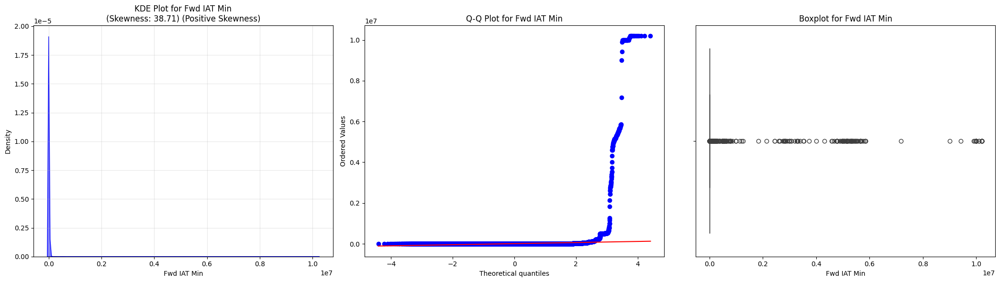

Bwd IAT Total: Skewness = 2.82 (Positive Skewness)


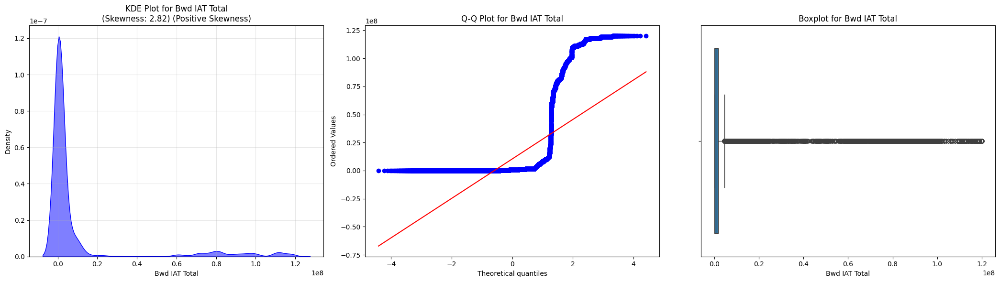

Bwd IAT Mean: Skewness = 7.28 (Positive Skewness)


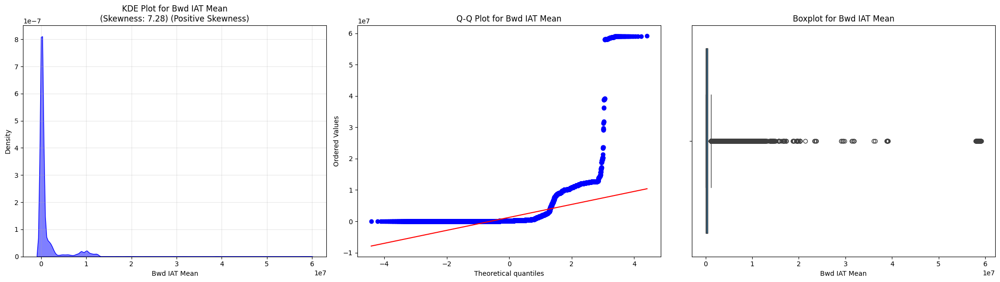

Bwd IAT Std: Skewness = 3.33 (Positive Skewness)


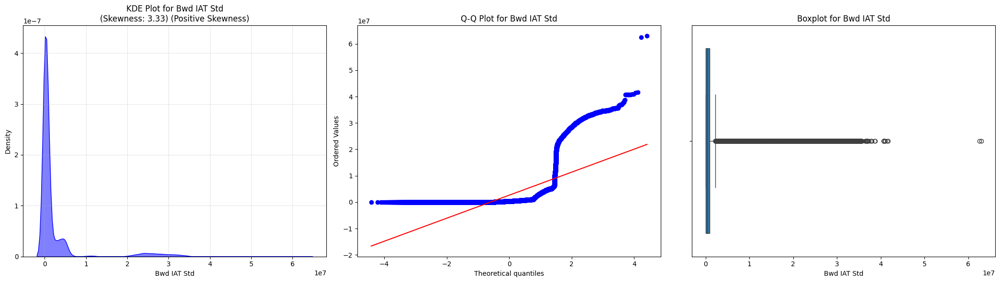

Bwd IAT Max: Skewness = 3.33 (Positive Skewness)


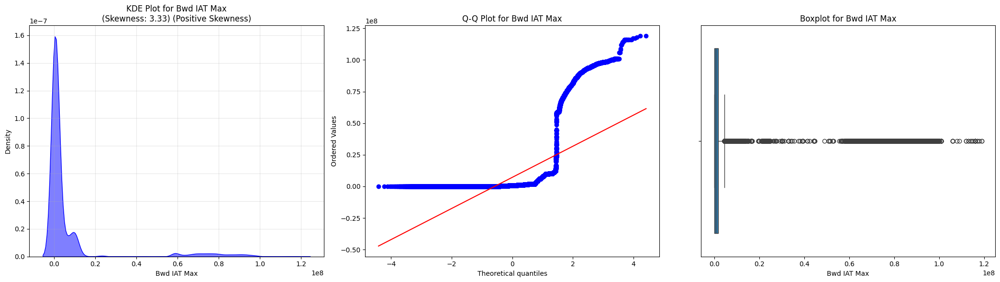

Bwd IAT Min: Skewness = 29.05 (Positive Skewness)


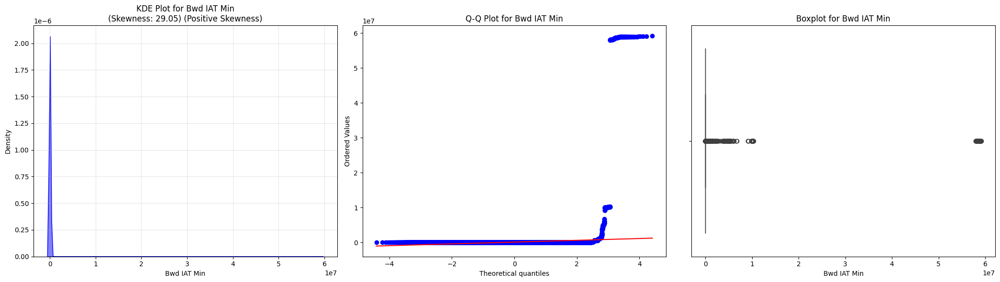

Fwd PSH Flags: Skewness = 4.30 (Positive Skewness)


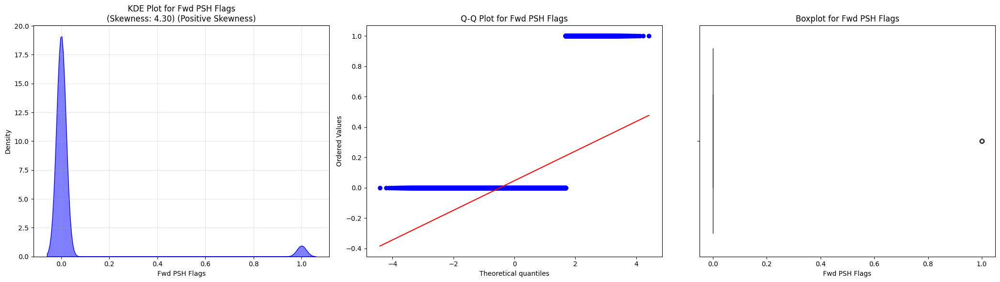

Fwd Header Length: Skewness = 45.35 (Positive Skewness)


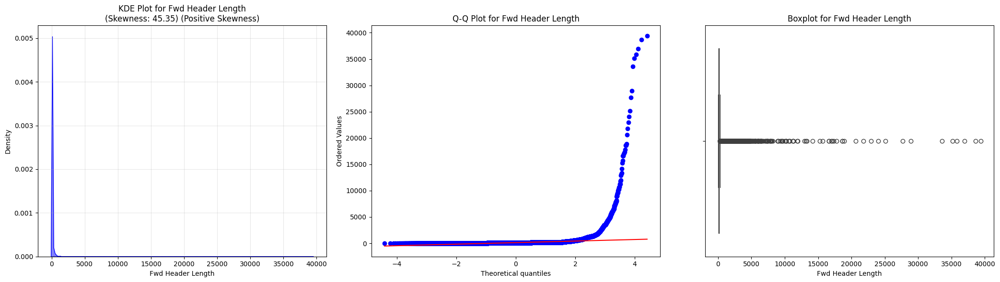

Bwd Header Length: Skewness = 43.70 (Positive Skewness)


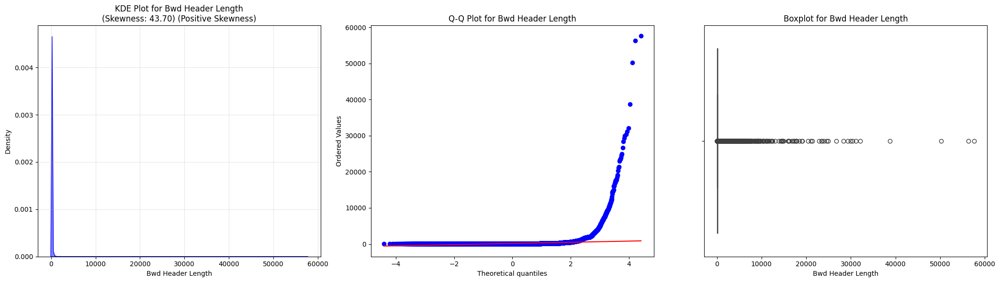

Fwd Packets/s: Skewness = 38.06 (Positive Skewness)


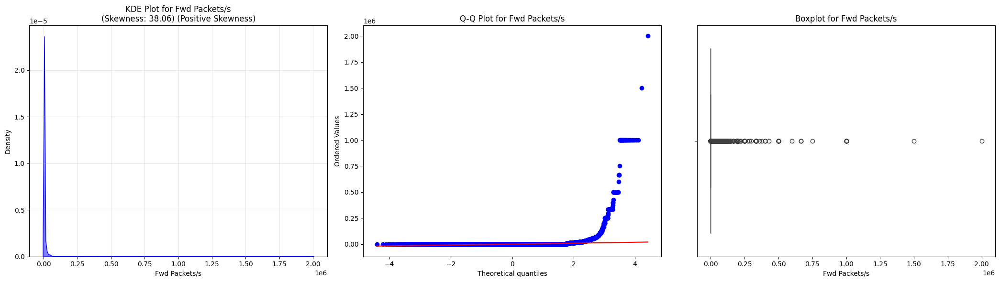

Bwd Packets/s: Skewness = 45.85 (Positive Skewness)


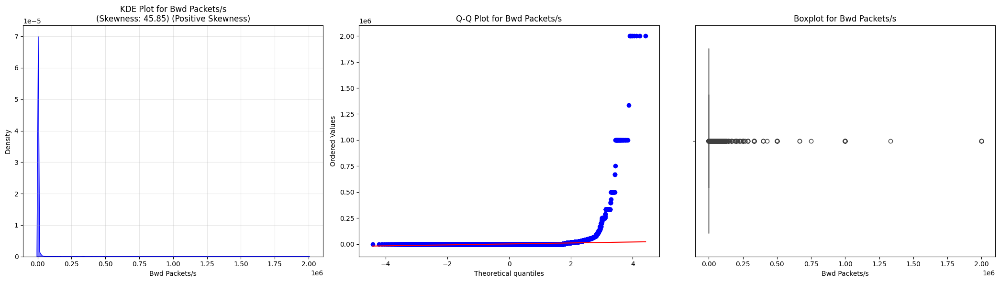

Min Packet Length: Skewness = 2.05 (Positive Skewness)


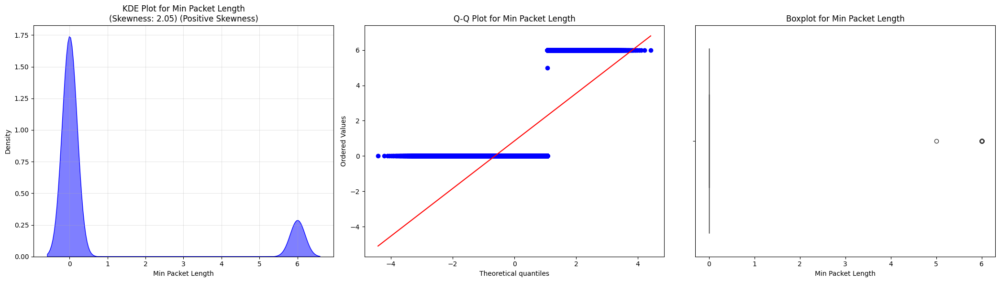

Max Packet Length: Skewness = -0.00 (Negative Skewness)


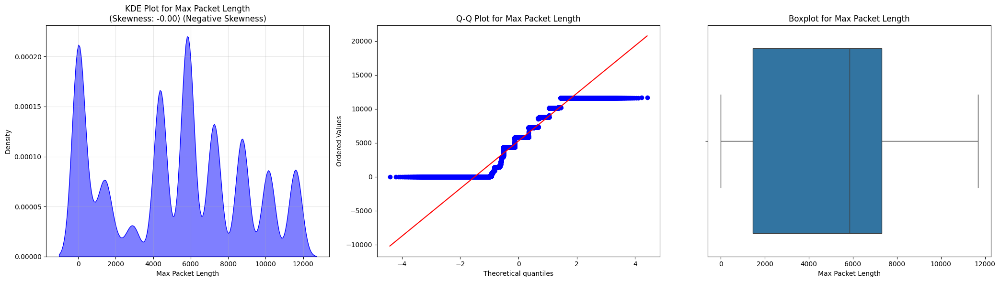

Packet Length Mean: Skewness = -0.48 (Negative Skewness)


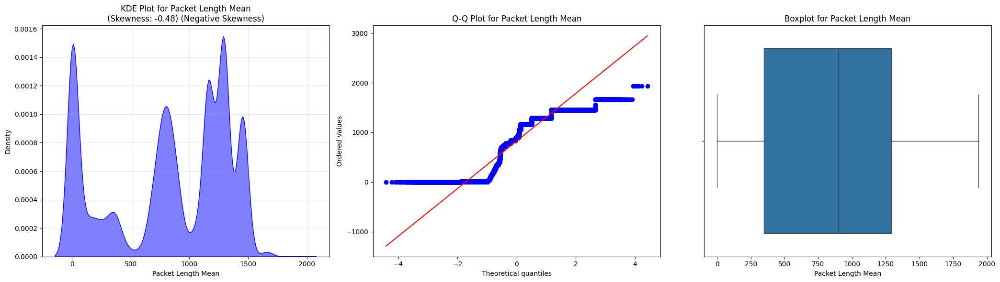

Packet Length Std: Skewness = -0.05 (Negative Skewness)


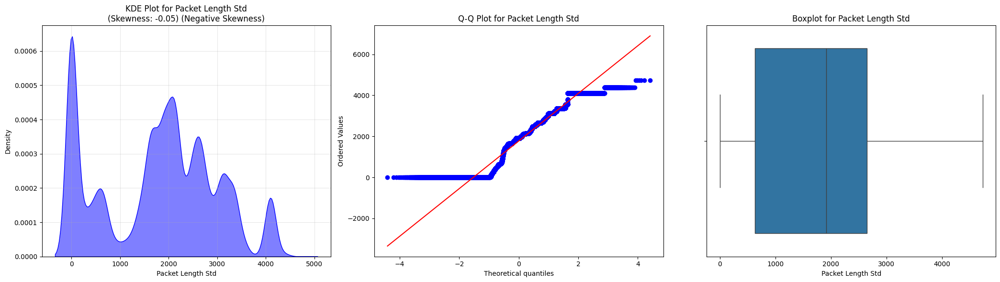

Packet Length Variance: Skewness = 1.10 (Positive Skewness)


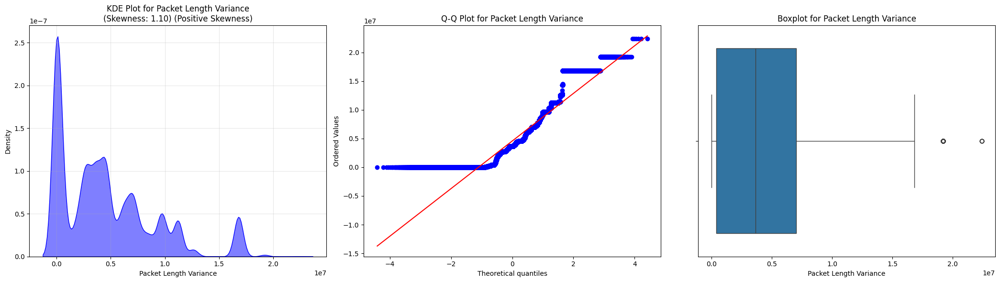

FIN Flag Count: Skewness = 21.85 (Positive Skewness)


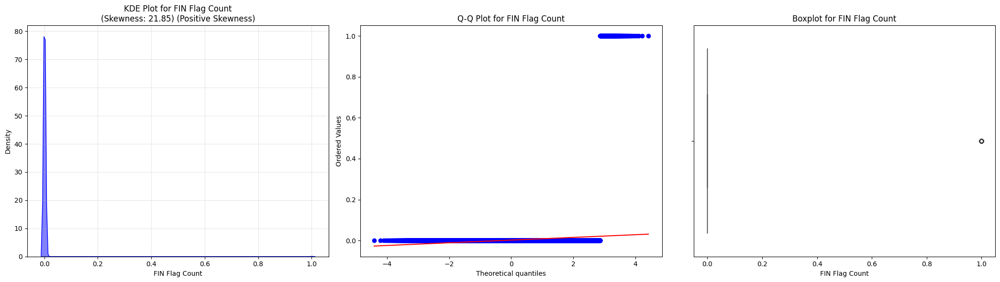

SYN Flag Count: Skewness = 4.30 (Positive Skewness)


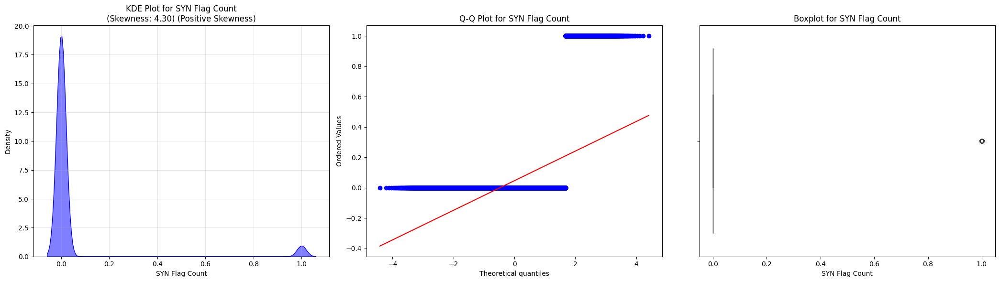

RST Flag Count: Skewness = 71.30 (Positive Skewness)


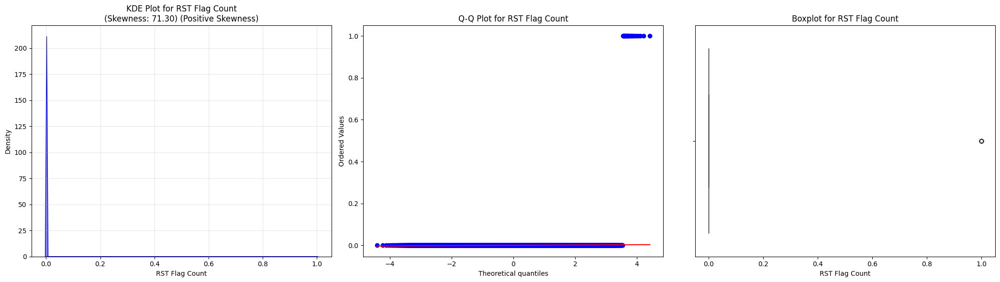

PSH Flag Count: Skewness = -0.30 (Negative Skewness)


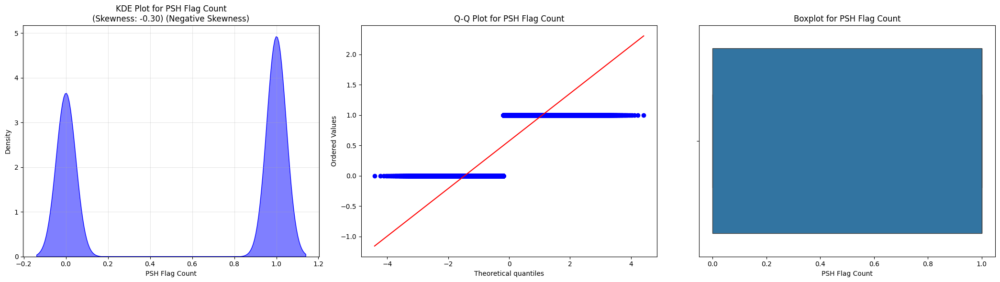

ACK Flag Count: Skewness = 0.28 (Positive Skewness)


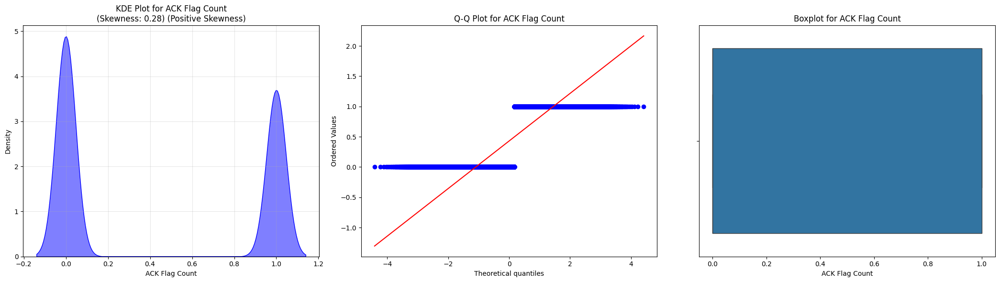

URG Flag Count: Skewness = 1.28 (Positive Skewness)


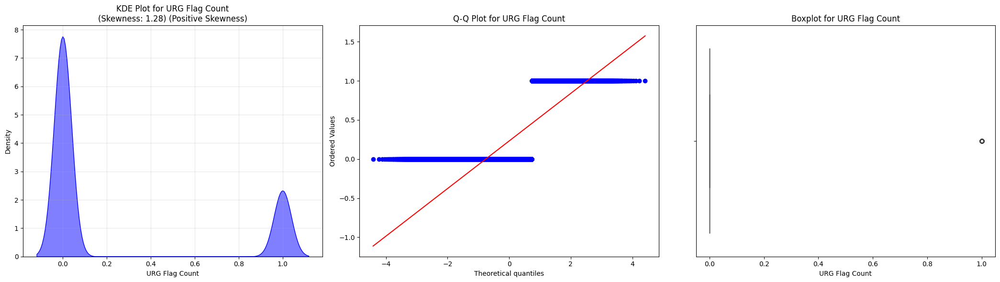

ECE Flag Count: Skewness = 71.30 (Positive Skewness)


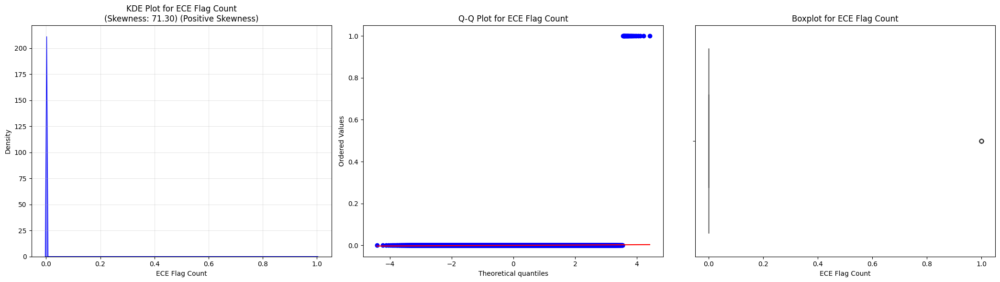

Down/Up Ratio: Skewness = 1.67 (Positive Skewness)


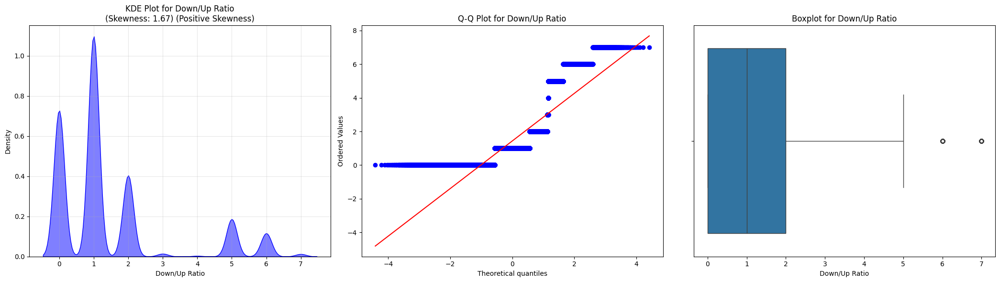

Average Packet Size: Skewness = -0.39 (Negative Skewness)


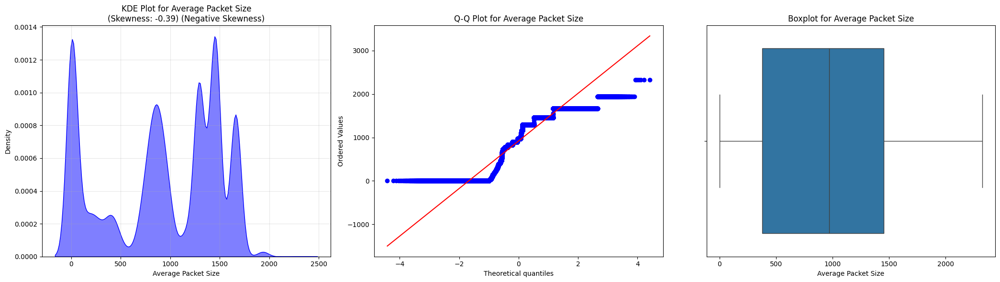

Avg Fwd Segment Size: Skewness = 2.38 (Positive Skewness)


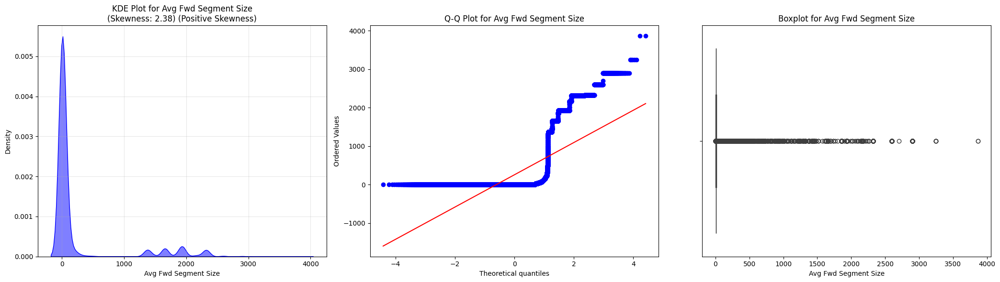

Avg Bwd Segment Size: Skewness = -0.22 (Negative Skewness)


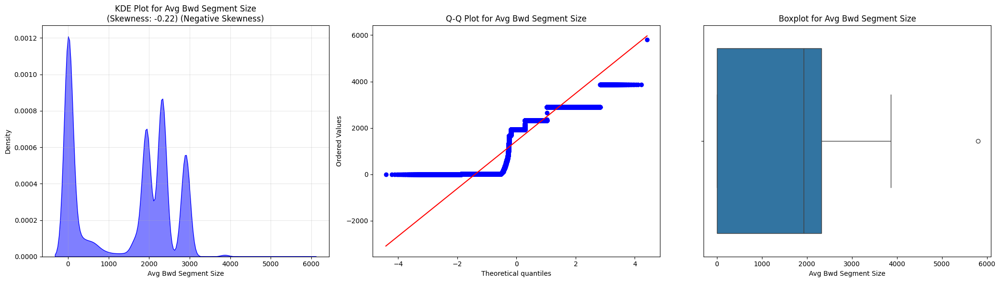

Subflow Fwd Packets: Skewness = 49.03 (Positive Skewness)


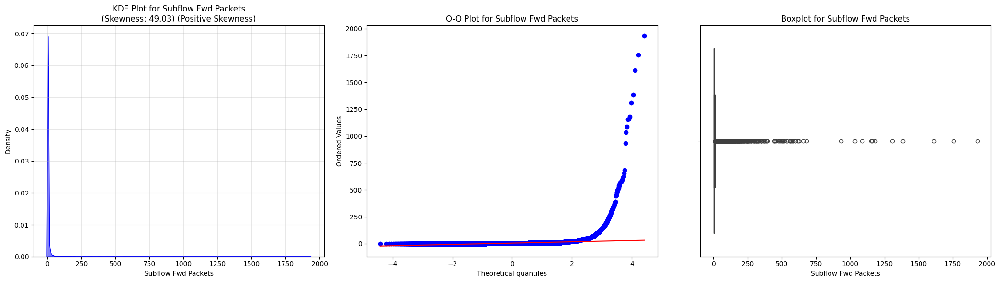

Subflow Fwd Bytes: Skewness = 5.39 (Positive Skewness)


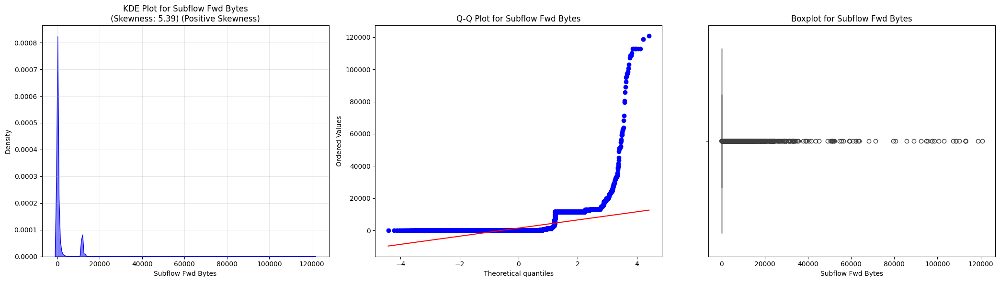

Subflow Bwd Packets: Skewness = 49.48 (Positive Skewness)


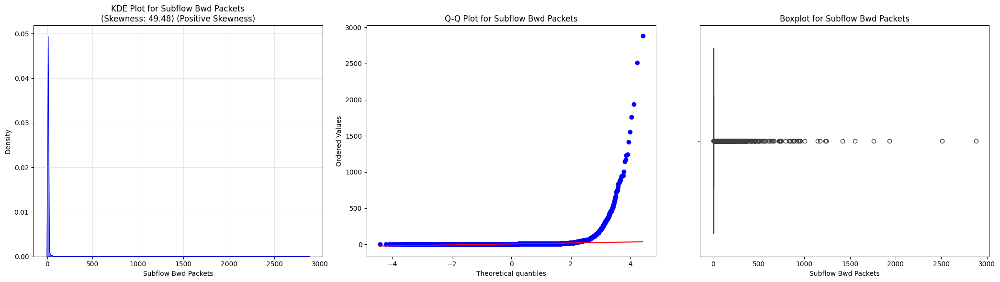

Subflow Bwd Bytes: Skewness = 55.91 (Positive Skewness)


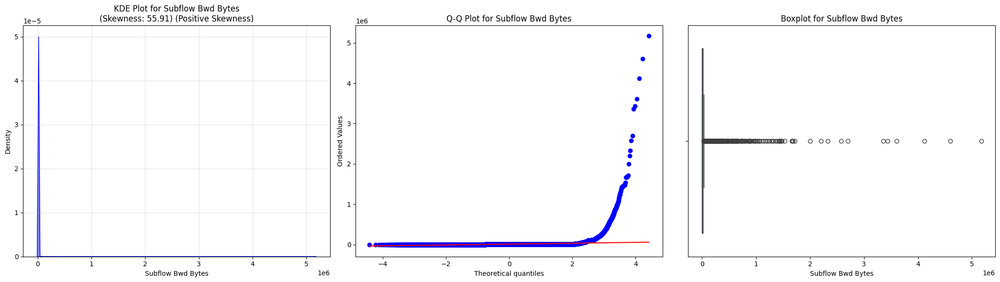

Init_Win_bytes_forward: Skewness = 3.54 (Positive Skewness)


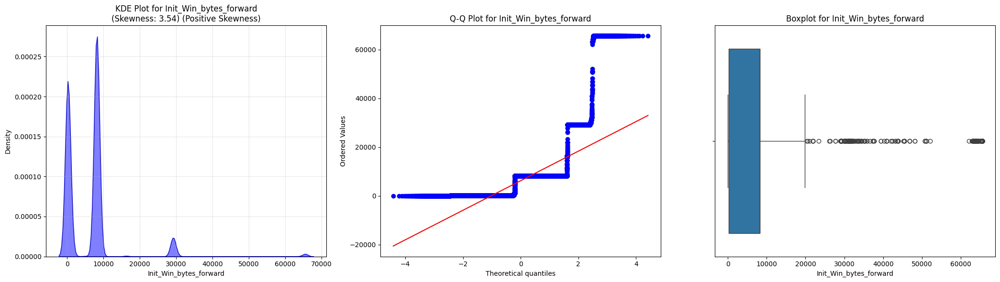

Init_Win_bytes_backward: Skewness = 8.85 (Positive Skewness)


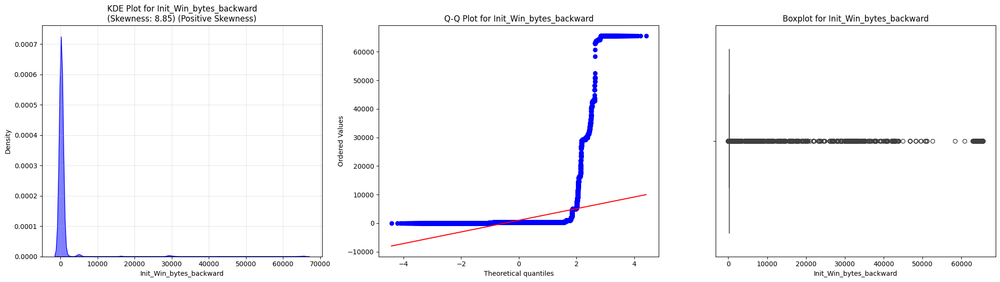

act_data_pkt_fwd: Skewness = 60.80 (Positive Skewness)


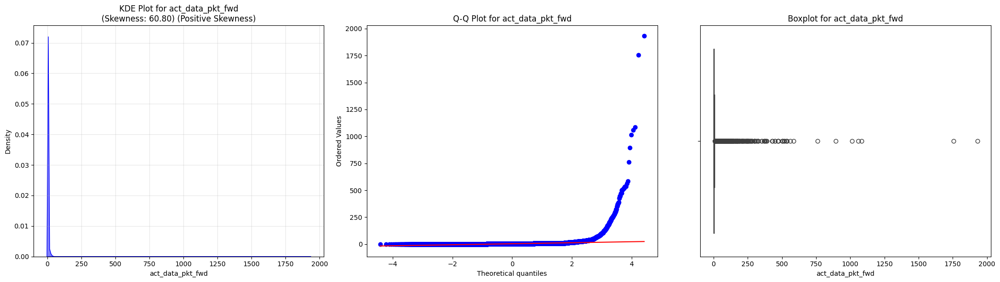

min_seg_size_forward: Skewness = 3.73 (Positive Skewness)


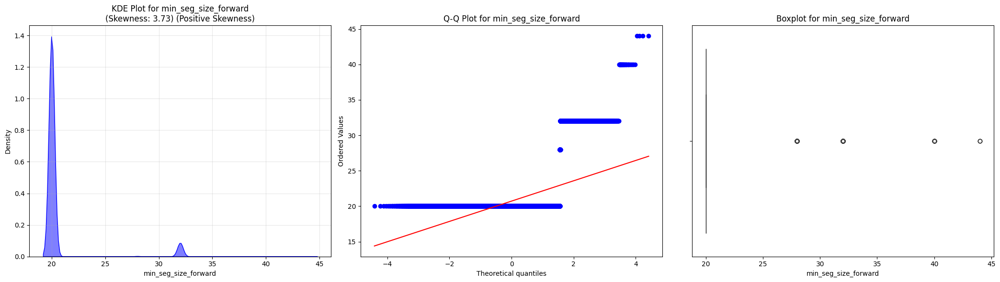

Active Mean: Skewness = 12.65 (Positive Skewness)


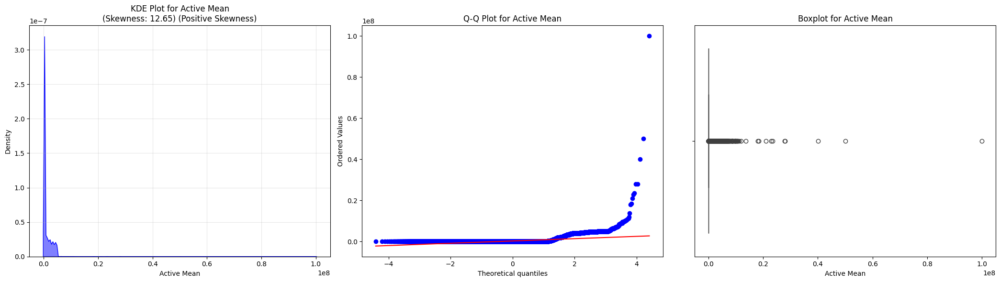

Active Std: Skewness = 74.68 (Positive Skewness)


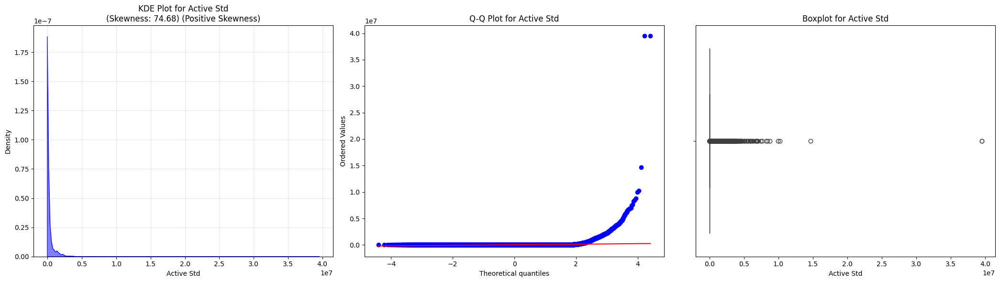

Active Max: Skewness = 12.54 (Positive Skewness)


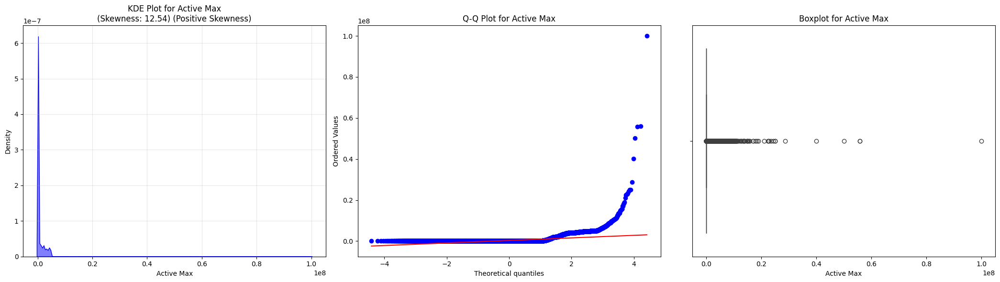

Active Min: Skewness = 12.74 (Positive Skewness)


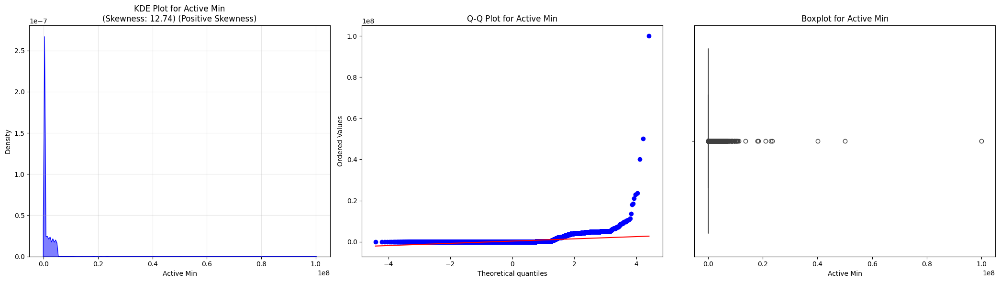

Idle Mean: Skewness = 1.75 (Positive Skewness)


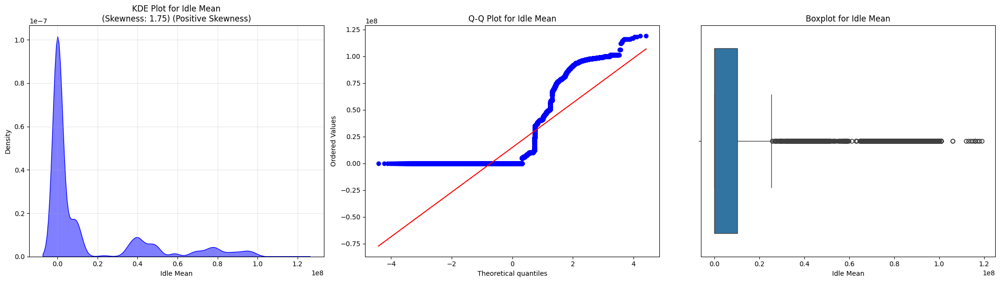

Idle Std: Skewness = 2.41 (Positive Skewness)


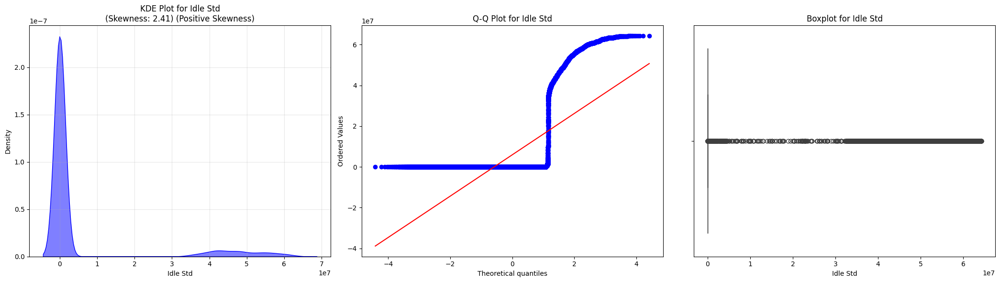

Idle Max: Skewness = 1.35 (Positive Skewness)


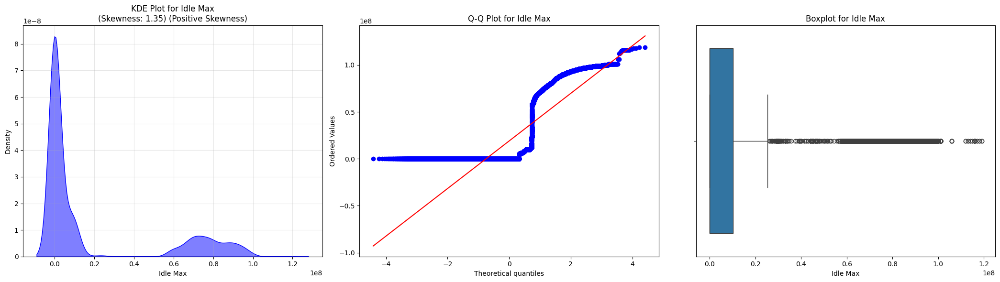

Idle Min: Skewness = 2.58 (Positive Skewness)


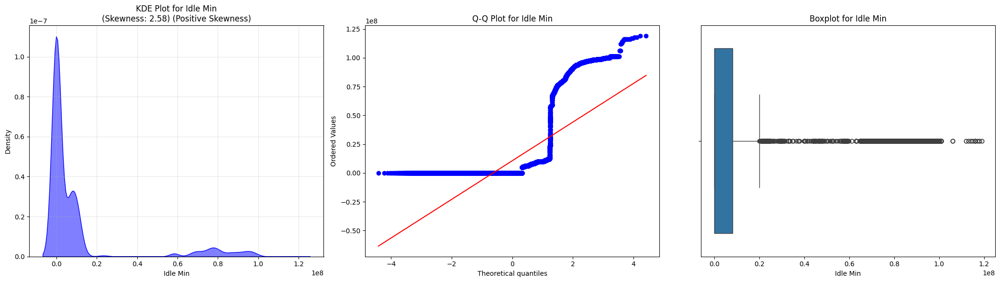

In [25]:
All_plot(X)

In [26]:
columns_to_transform = [
    'Destination Port', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets',
    'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Fwd Packet Length Max',
    'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Std',
    'Bwd Packet Length Min', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean',
    'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean',
    'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
    'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd Header Length',
    'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Min Packet Length',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'URG Flag Count', 'ECE Flag Count', 'Down/Up Ratio', 'Avg Fwd Segment Size',
    'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes',
    'Init_Win_bytes_forward', 'Init_Win_bytes_backward', 'act_data_pkt_fwd',
    'min_seg_size_forward', 'Active Mean', 'Active Std', 'Active Max', 'Active Min',
    'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

In [27]:
transformed_X, lambdas_X = Advance_column_transformer(X, columns=columns_to_transform, method='yeo-johnson', standardize=True)

In [28]:
transformed_X

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Min,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,URG Flag Count,ECE Flag Count,Down/Up Ratio,Avg Fwd Segment Size,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Bwd Packet Length Max,Bwd Packet Length Mean,Bwd Packet Length Std,Max Packet Length,Packet Length Mean,Packet Length Std,PSH Flag Count,ACK Flag Count,Average Packet Size,Avg Bwd Segment Size
0,1.561530,-2.204481,-1.661309,-2.583906,-1.225267,-1.562920,-1.071839,2.218183,-0.593236,-1.640342,2.071043,1.172552,2.004509,-2.038751,-2.236365,-2.182425,1.594828,-1.54786,-1.551885,-1.503823,-1.550422,-1.312118,-2.078028,-2.04928,-1.94092,-2.058873,-1.661065,-0.220955,-1.788696,-2.881378,1.987827,1.993268,2.460042,-1.852947,-0.045681,-0.220955,-0.014022,1.826232,-0.014022,0.090275,-0.593236,-1.661309,-1.225267,-2.583906,-1.562920,-1.844438,0.263150,-1.697373,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,6.0,6.0,0.0,6.0,6.0,0.0,0.0,1.0,9.0,6.0
1,1.561531,-2.297634,-1.661309,-2.583906,-1.225267,-1.562920,-1.071839,2.218183,-0.593236,-1.640342,2.071043,1.408590,2.052049,-2.150588,-2.236365,-2.274431,1.261191,-1.54786,-1.551885,-1.503823,-1.550422,-1.312118,-2.078028,-2.04928,-1.94092,-2.058873,-1.661065,-0.220955,-1.788696,-2.881378,2.013090,2.031763,2.460042,-1.852947,-0.045681,-0.220955,-0.014022,1.826232,-0.014022,0.090275,-0.593236,-1.661309,-1.225267,-2.583906,-1.562920,-1.844438,0.263150,-1.697373,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,6.0,6.0,0.0,6.0,6.0,0.0,0.0,1.0,9.0,6.0
2,1.548771,-2.347825,-1.661309,-2.583906,-1.225267,-1.562920,-1.071839,2.218183,-0.593236,-1.640342,2.071043,1.546172,2.075383,-2.210232,-2.236365,-2.323882,1.050616,-1.54786,-1.551885,-1.503823,-1.550422,-1.312118,-2.078028,-2.04928,-1.94092,-2.058873,-1.661065,-0.220955,-1.788696,-2.881378,2.024690,2.050040,2.460042,-1.852947,-0.045681,-0.220955,-0.014022,1.826232,-0.014022,0.090275,-0.593236,-1.661309,-1.225267,-2.583906,-1.562920,-1.825803,0.404037,-1.697373,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,6.0,6.0,0.0,6.0,6.0,0.0,0.0,1.0,9.0,6.0
3,1.561365,-2.323167,-1.661309,-2.583906,-1.225267,-1.562920,-1.071839,2.218183,-0.593236,-1.640342,2.071043,1.477557,2.064109,-2.180985,-2.236365,-2.299598,1.157093,-1.54786,-1.551885,-1.503823,-1.550422,-1.312118,-2.078028,-2.04928,-1.94092,-2.058873,-1.661065,-0.220955,-1.788696,-2.881378,2.019154,2.041264,2.460042,-1.852947,-0.045681,-0.220955,-0.014022,-0.547576,-0.014022,0.090275,-0.593236,-1.661309,-1.225267,-2.583906,-1.562920,-1.816853,0.263150,-1.697373,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,6.0,6.0,0.0,6.0,6.0,0.0,0.0,1.0,9.0,6.0
4,1.529314,-2.293059,-1.661309,-2.583906,-3.015543,-1.728431,-3.238313,-0.449403,-3.538371,-1.640342,-0.483485,-1.990353,2.049846,-2.145129,-2.236365,-2.269919,1.279218,-1.54786,-1.551885,-1.503823,-1.550422,-1.312118,-2.078028,-2.04928,-1.94092,-2.058873,-1.661065,-0.220955,-1.175815,-2.040629,2.011966,2.030015,-0.406497,-1.852947,-0.045681,-0.220955,-0.014022,1.826232,-0.014022,0.090275,-3.538371,-1.661309,-3.015543,-2.583906,-1.728431,-0.536506,1.236120,-1.697373,8.881784e-16

In [29]:
lambdas_X

,columns,lambdas
0,Destination Port,-0.404346
1,Flow Duration,0.092738
2,Total Fwd Packets,-0.396652
3,Total Backward Packets,-0.281678
4,Total Length of Fwd Packets,-0.189140
5,Total Length of Bwd Packets,0.244111
6,Fwd Packet Length Max,-0.242921
7,Fwd Packet Length Min,-2.072042
8,Fwd Packet Length Mean,-0.364620
9,Fwd Packet Length Std,-0.198621


Destination Port: Skewness = 0.74 (Positive Skewness)


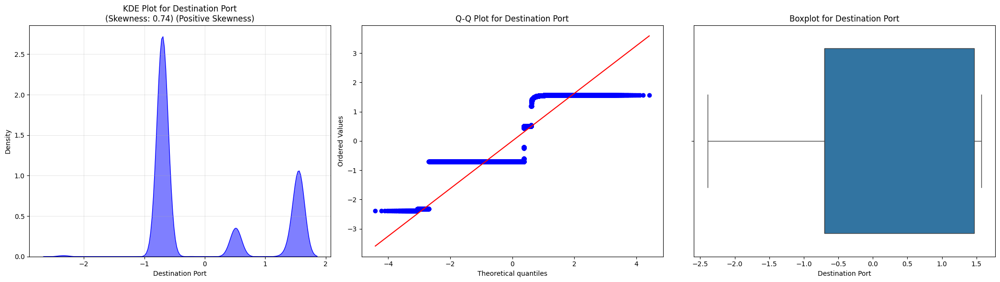

Flow Duration: Skewness = -0.05 (Negative Skewness)


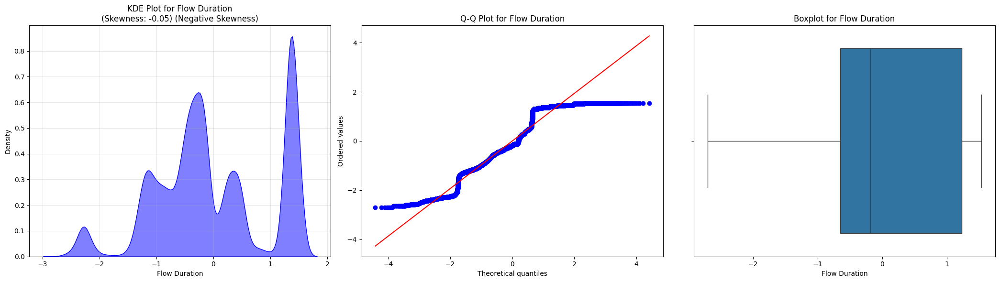

Total Fwd Packets: Skewness = 0.01 (Positive Skewness)


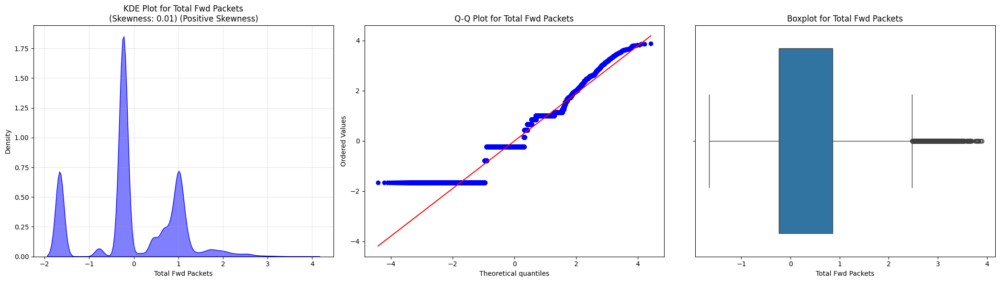

Total Backward Packets: Skewness = -0.20 (Negative Skewness)


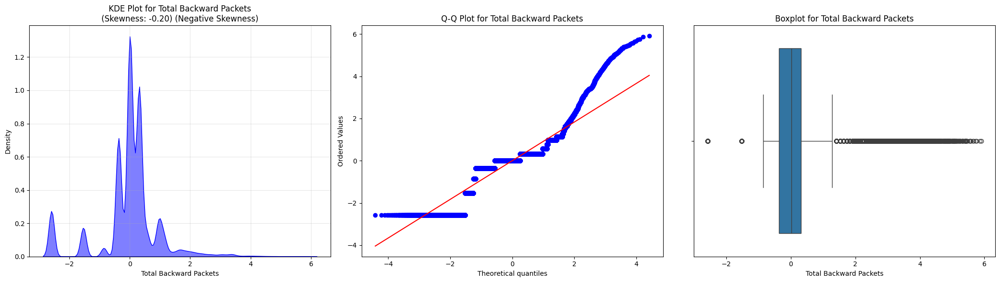

Total Length of Fwd Packets: Skewness = 0.01 (Positive Skewness)


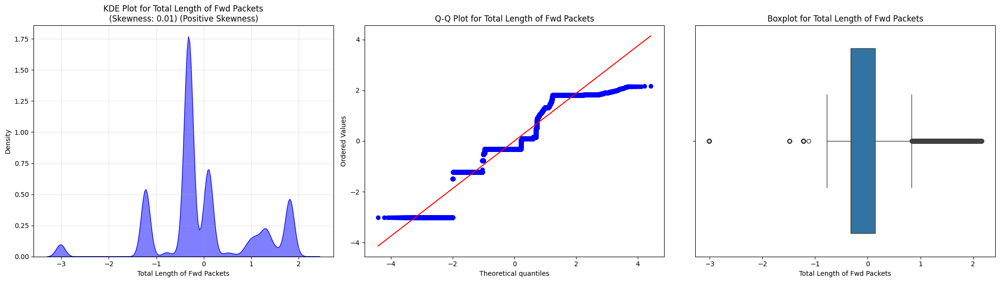

Total Length of Bwd Packets: Skewness = -0.28 (Negative Skewness)


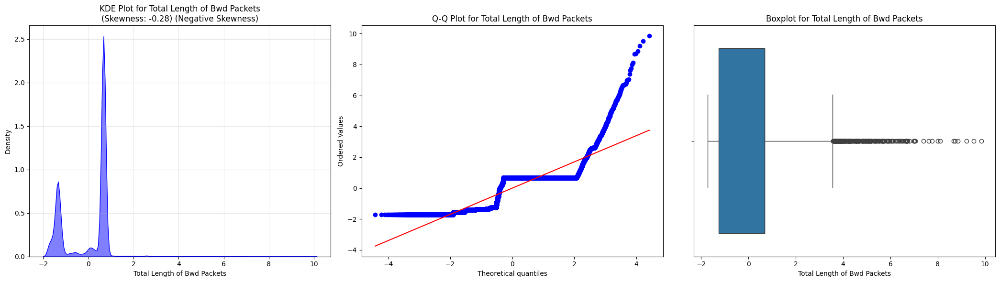

Fwd Packet Length Max: Skewness = -0.02 (Negative Skewness)


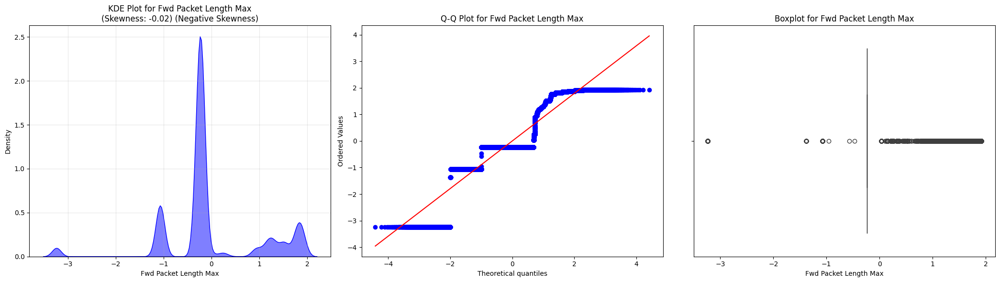

Fwd Packet Length Min: Skewness = 1.78 (Positive Skewness)


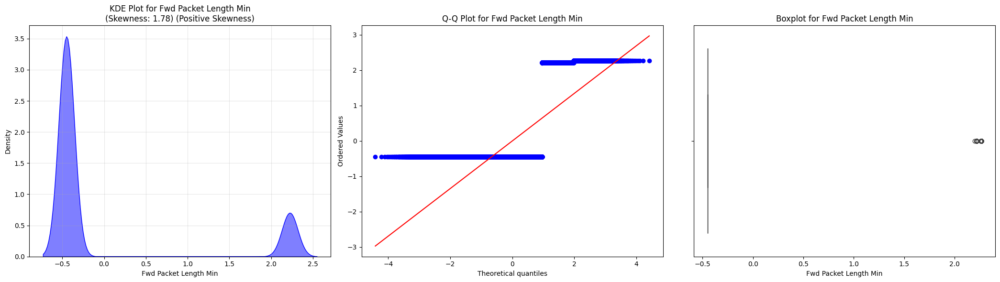

Fwd Packet Length Mean: Skewness = -0.06 (Negative Skewness)


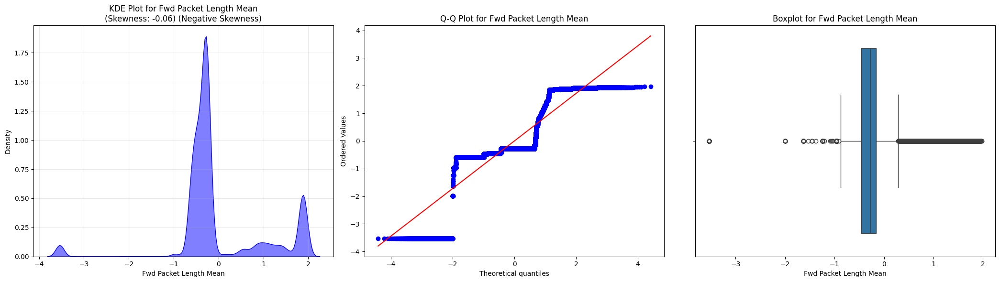

Fwd Packet Length Std: Skewness = 0.07 (Positive Skewness)


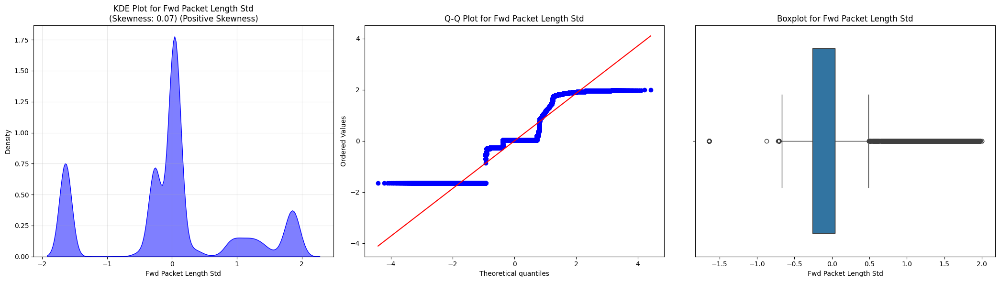

Bwd Packet Length Min: Skewness = 1.59 (Positive Skewness)


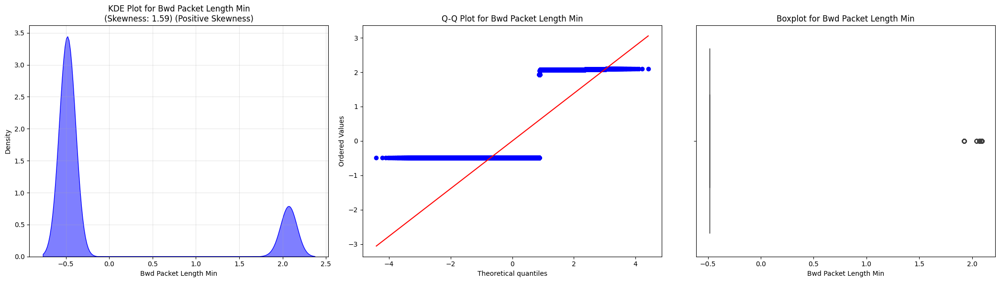

Flow Bytes/s: Skewness = -0.03 (Negative Skewness)


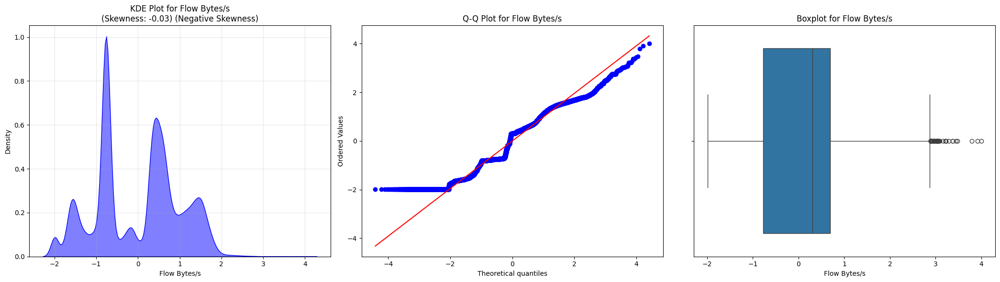

Flow Packets/s: Skewness = 0.26 (Positive Skewness)


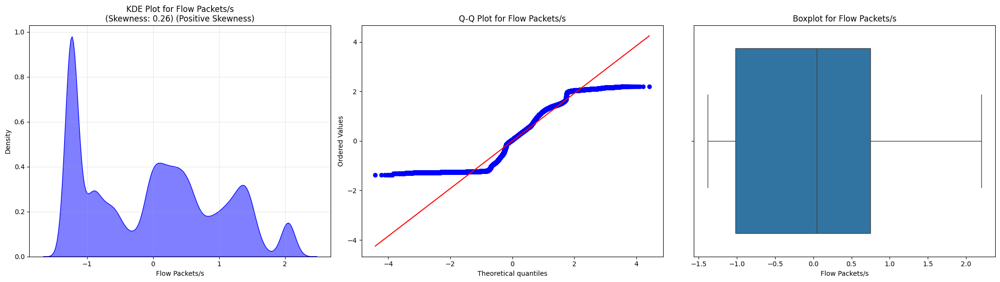

Flow IAT Mean: Skewness = -0.08 (Negative Skewness)


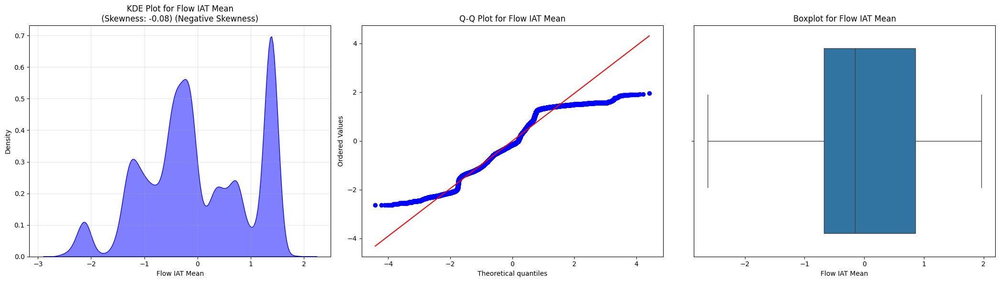

Flow IAT Std: Skewness = -0.10 (Negative Skewness)


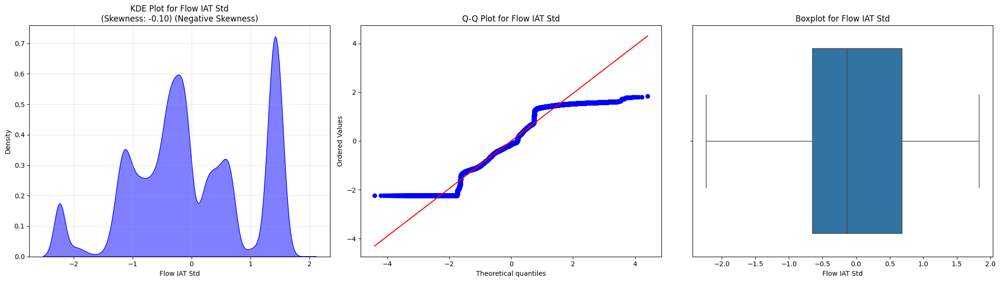

Flow IAT Max: Skewness = -0.05 (Negative Skewness)


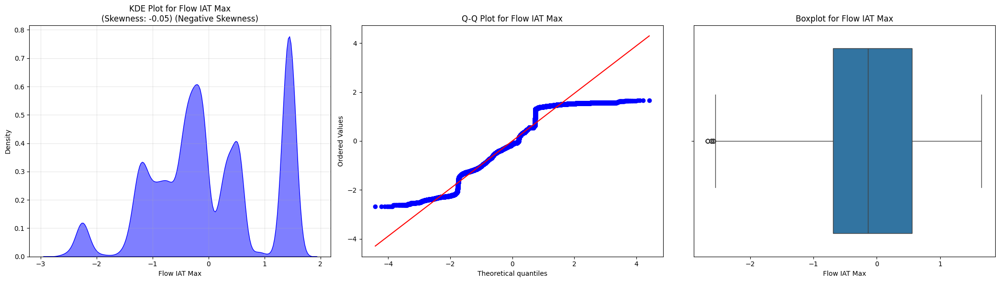

Flow IAT Min: Skewness = -14.30 (Negative Skewness)


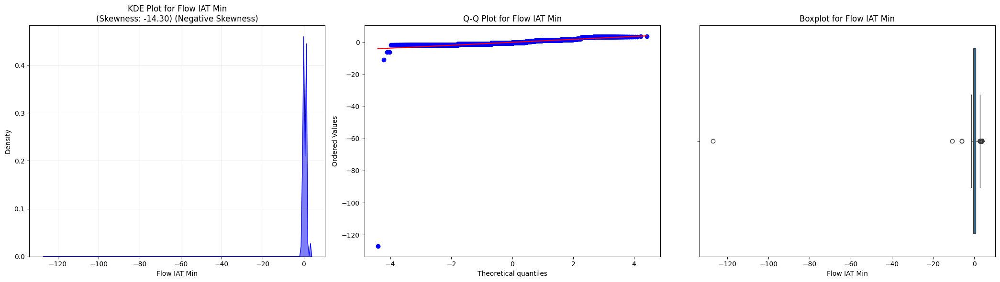

Fwd IAT Total: Skewness = -0.03 (Negative Skewness)


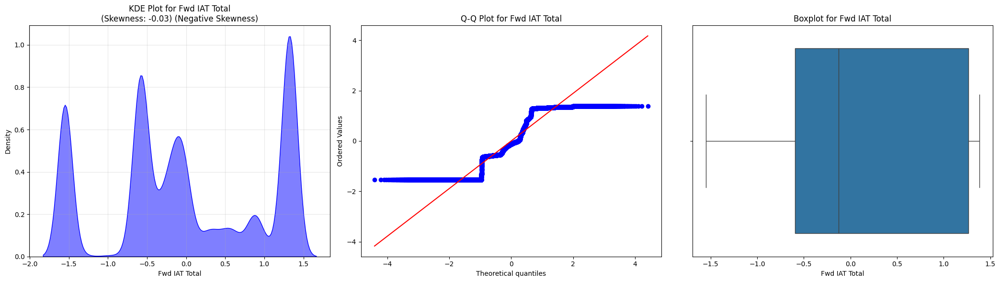

Fwd IAT Mean: Skewness = -0.04 (Negative Skewness)


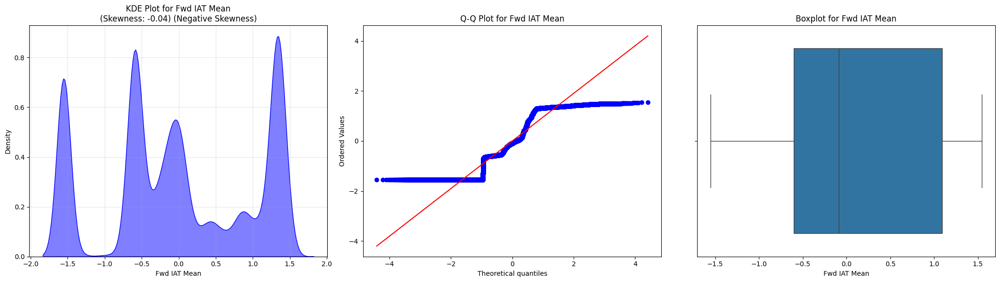

Fwd IAT Std: Skewness = -0.02 (Negative Skewness)


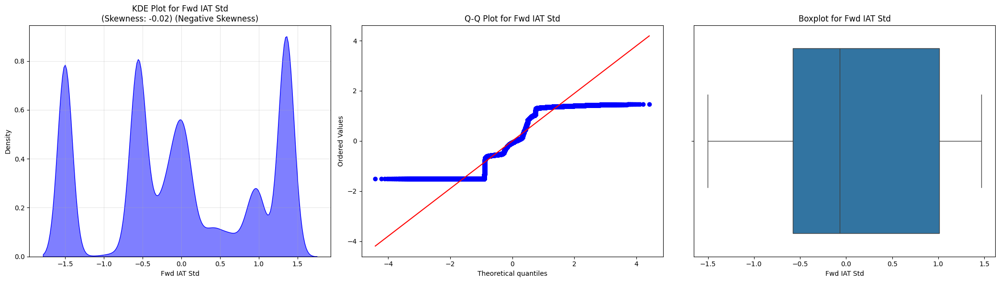

Fwd IAT Max: Skewness = -0.03 (Negative Skewness)


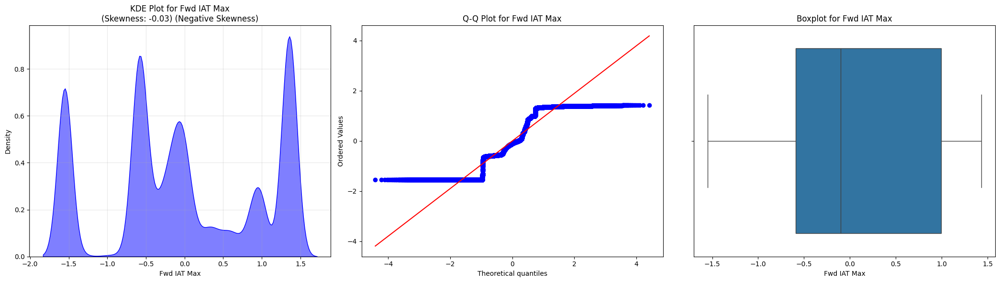

Fwd IAT Min: Skewness = -1.33 (Negative Skewness)


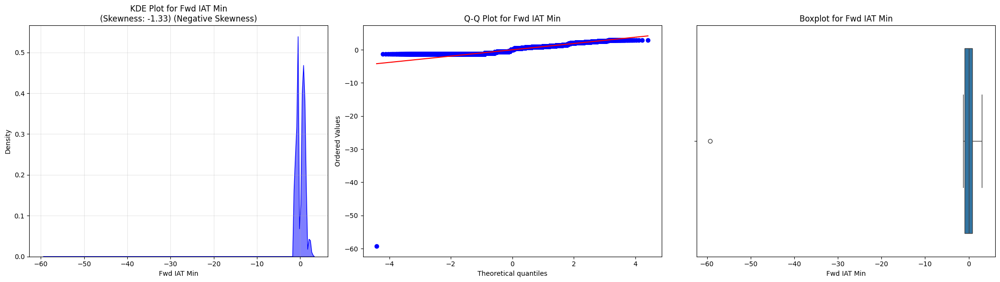

Bwd IAT Total: Skewness = -0.01 (Negative Skewness)


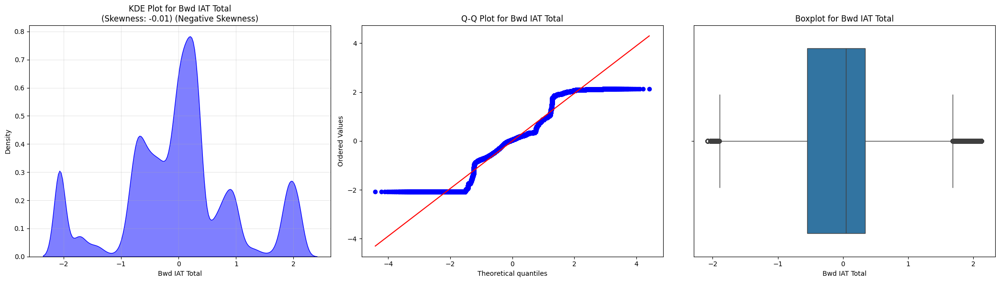

Bwd IAT Mean: Skewness = -0.05 (Negative Skewness)


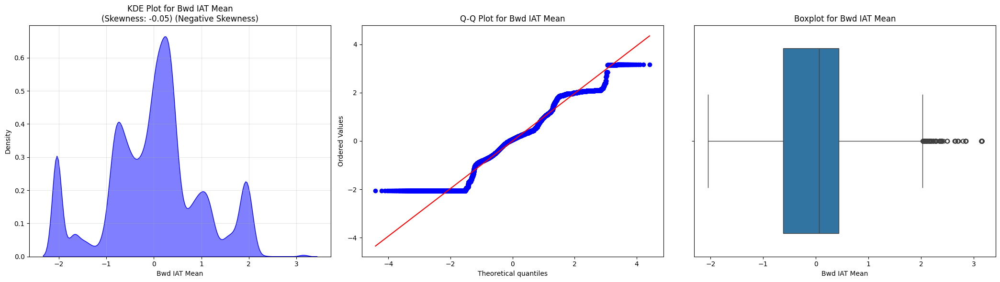

Bwd IAT Std: Skewness = -0.09 (Negative Skewness)


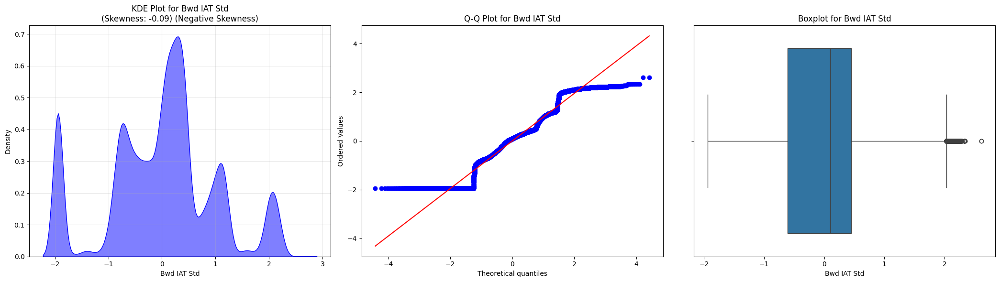

Bwd IAT Max: Skewness = -0.03 (Negative Skewness)


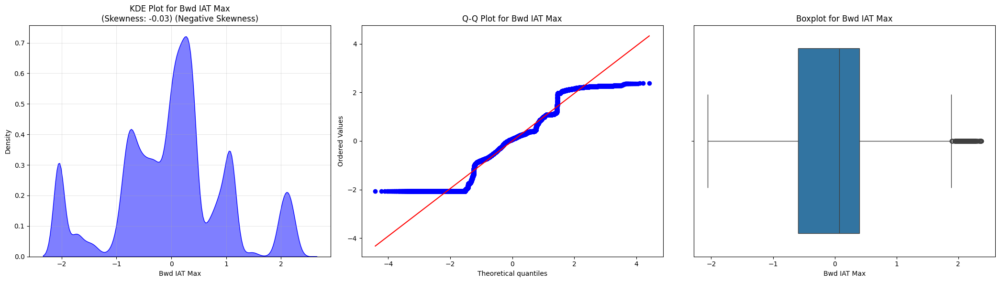

Bwd IAT Min: Skewness = 0.15 (Positive Skewness)


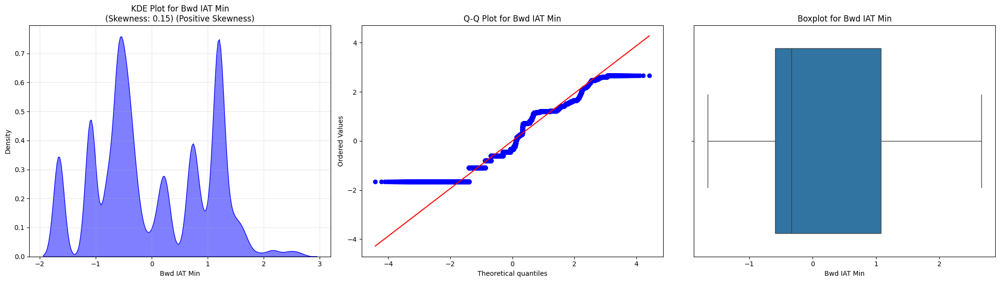

Fwd PSH Flags: Skewness = 4.30 (Positive Skewness)


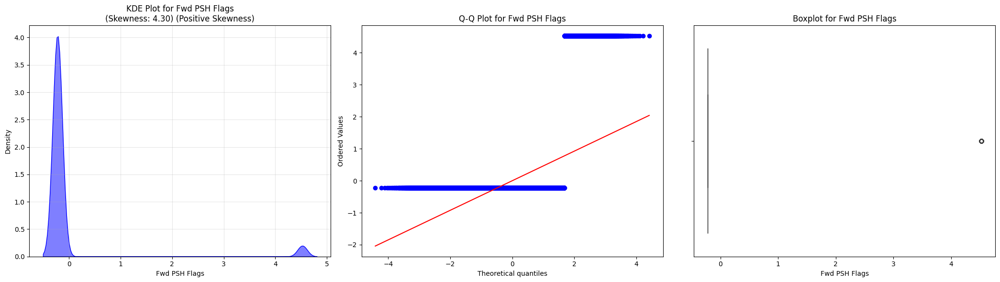

Fwd Header Length: Skewness = -0.02 (Negative Skewness)


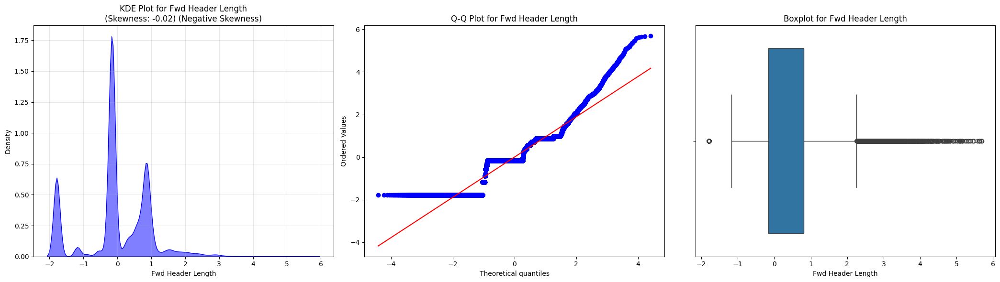

Bwd Header Length: Skewness = -0.13 (Negative Skewness)


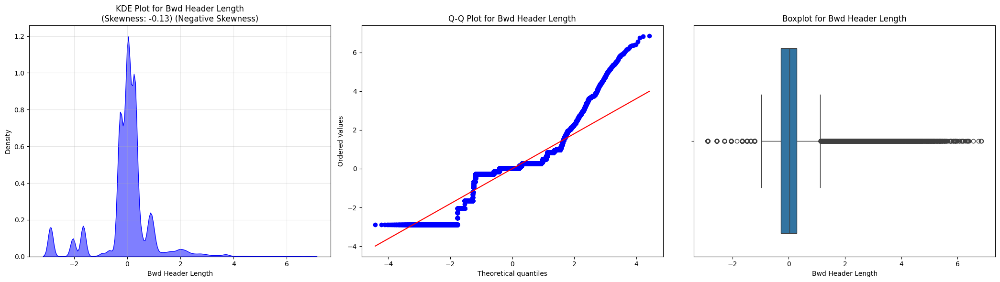

Fwd Packets/s: Skewness = 0.40 (Positive Skewness)


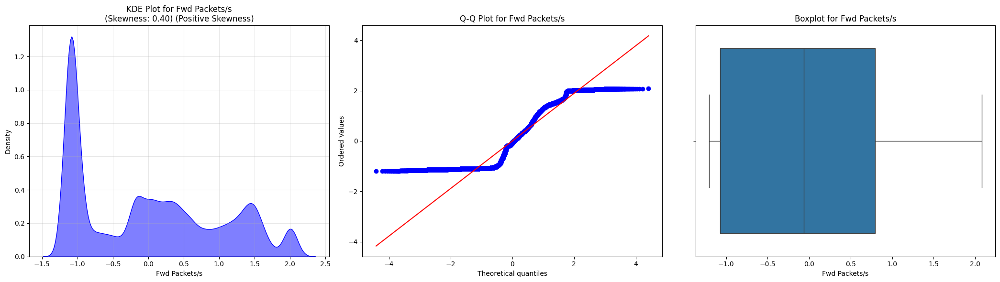

Bwd Packets/s: Skewness = 0.31 (Positive Skewness)


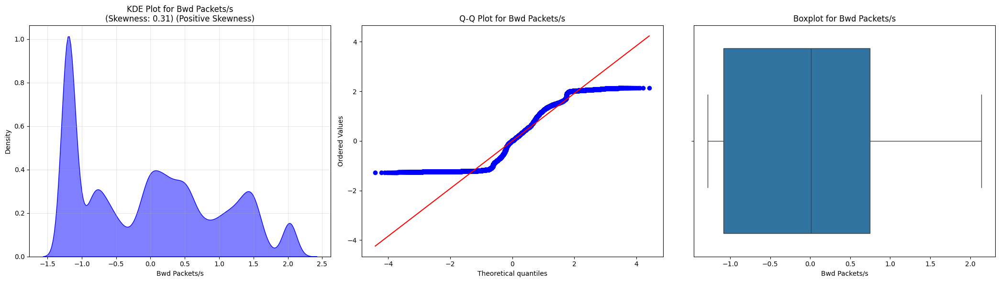

Min Packet Length: Skewness = 2.05 (Positive Skewness)


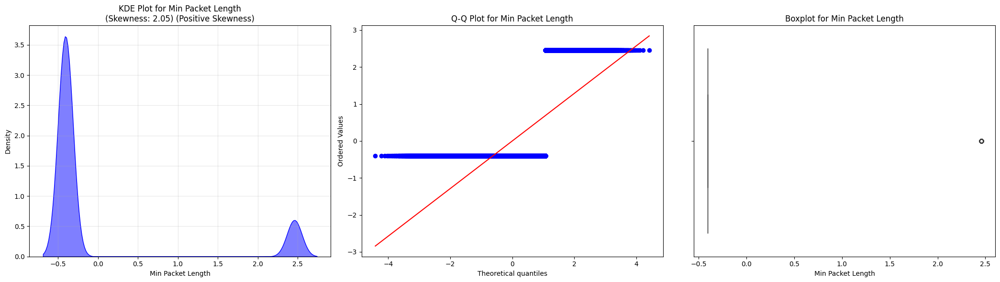

Packet Length Variance: Skewness = -0.84 (Negative Skewness)


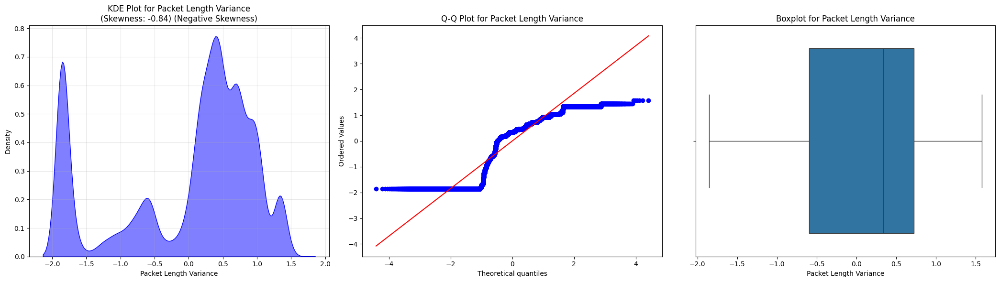

FIN Flag Count: Skewness = 21.85 (Positive Skewness)


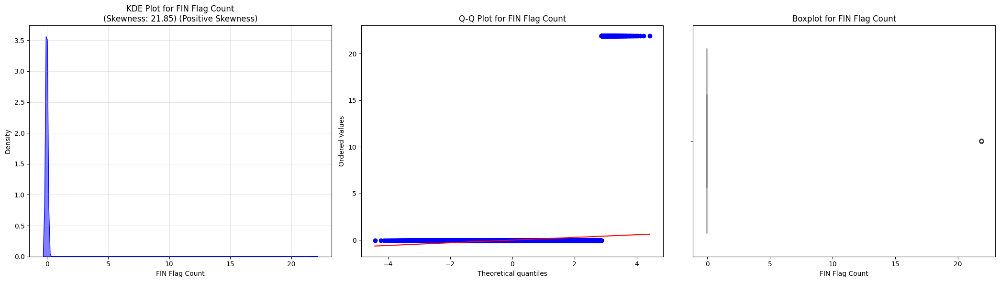

SYN Flag Count: Skewness = 4.30 (Positive Skewness)


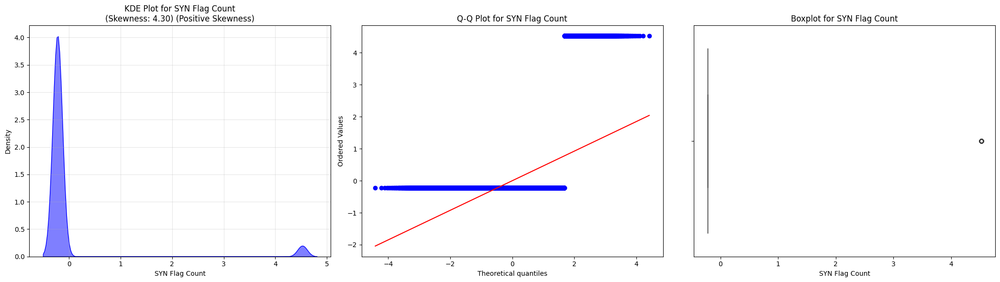

RST Flag Count: Skewness = 71.30 (Positive Skewness)


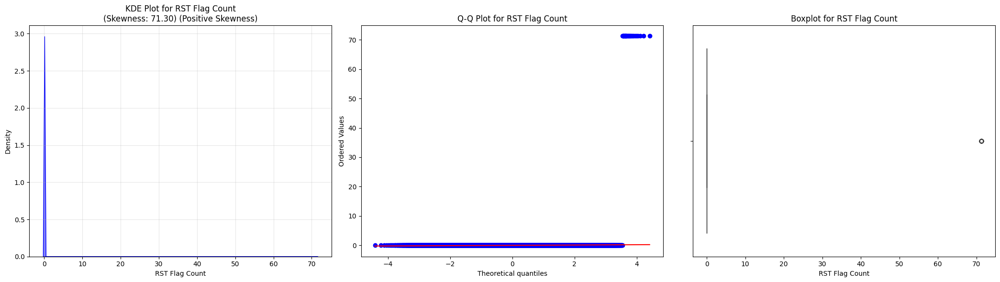

URG Flag Count: Skewness = 1.28 (Positive Skewness)


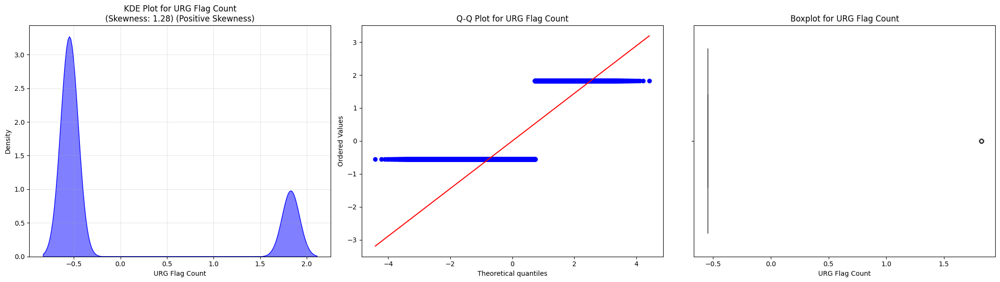

ECE Flag Count: Skewness = 71.30 (Positive Skewness)


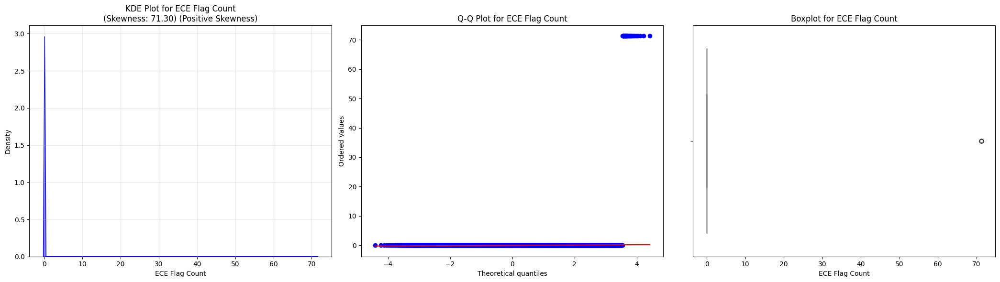

Down/Up Ratio: Skewness = 0.06 (Positive Skewness)


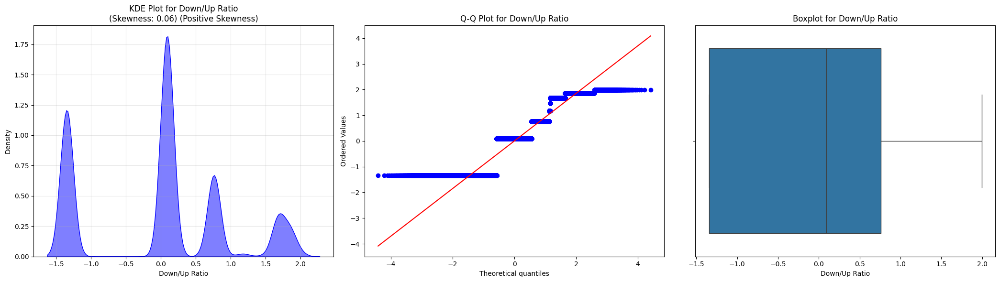

Avg Fwd Segment Size: Skewness = -0.06 (Negative Skewness)


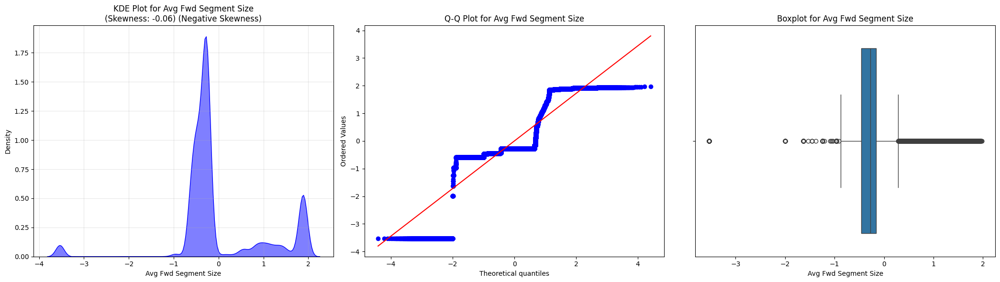

Subflow Fwd Packets: Skewness = 0.01 (Positive Skewness)


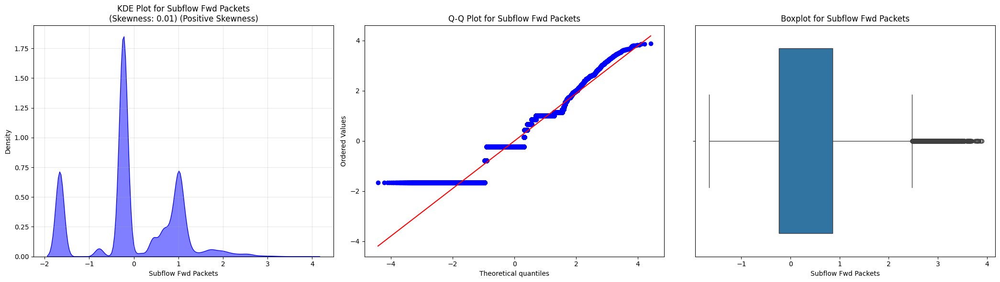

Subflow Fwd Bytes: Skewness = 0.01 (Positive Skewness)


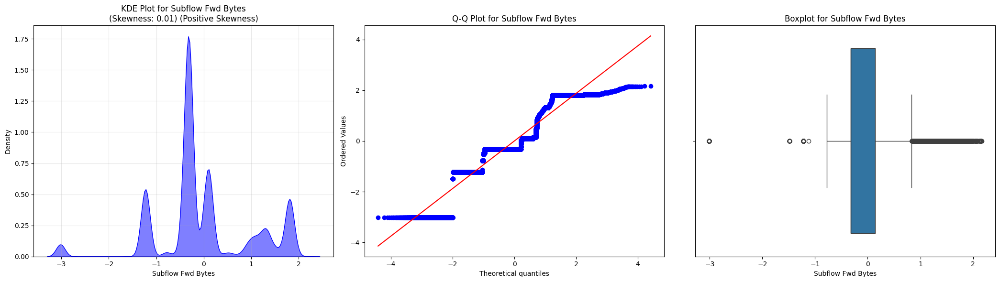

Subflow Bwd Packets: Skewness = -0.20 (Negative Skewness)


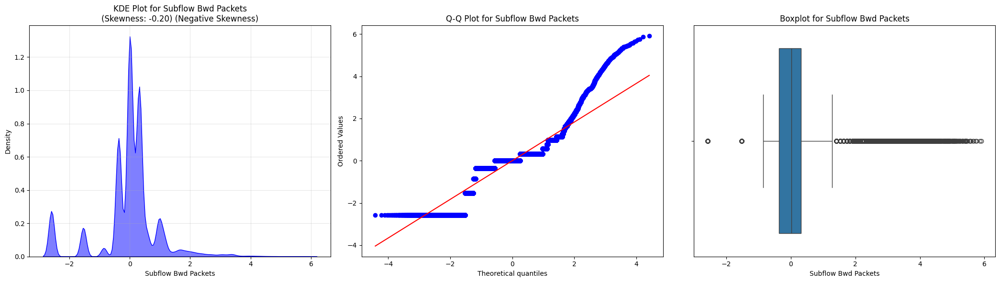

Subflow Bwd Bytes: Skewness = -0.28 (Negative Skewness)


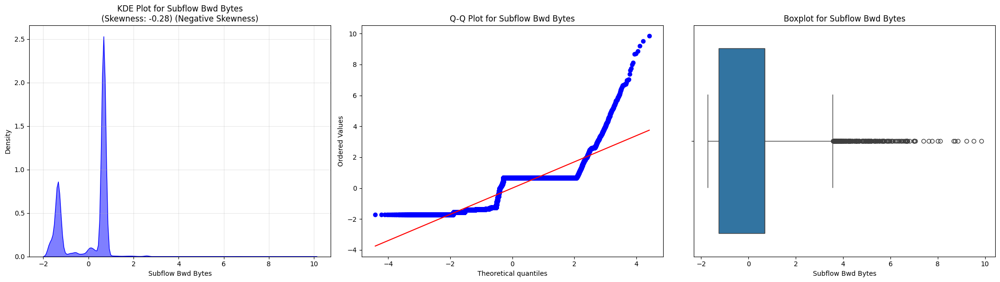

Init_Win_bytes_forward: Skewness = -0.15 (Negative Skewness)


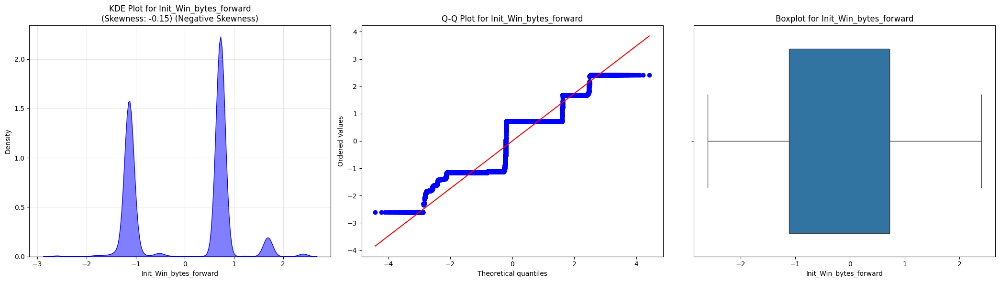

Init_Win_bytes_backward: Skewness = 0.24 (Positive Skewness)


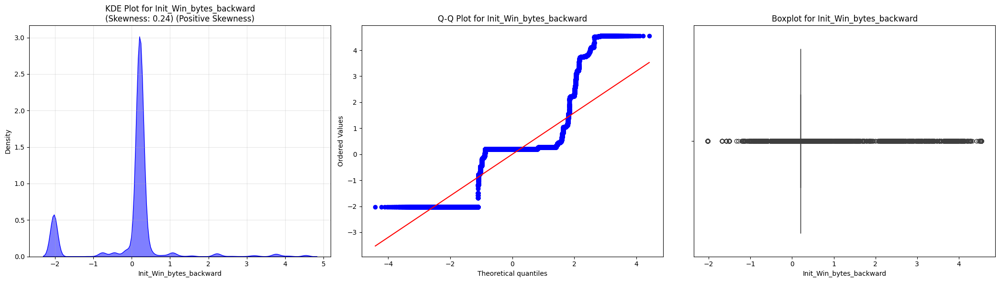

act_data_pkt_fwd: Skewness = -0.02 (Negative Skewness)


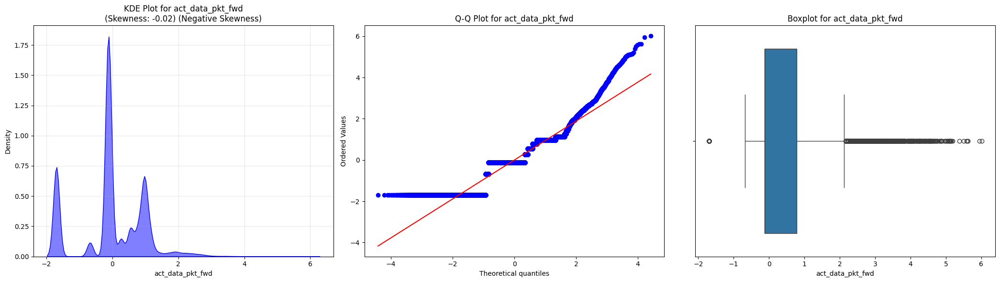

min_seg_size_forward: Skewness = 0.00 (Approximately Symmetrical)


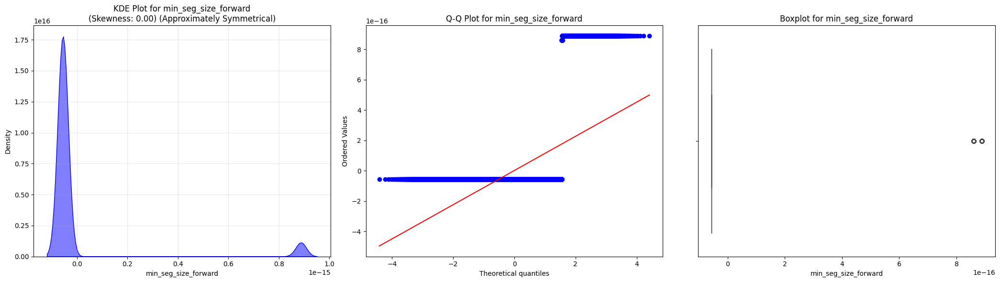

Active Mean: Skewness = 0.59 (Positive Skewness)


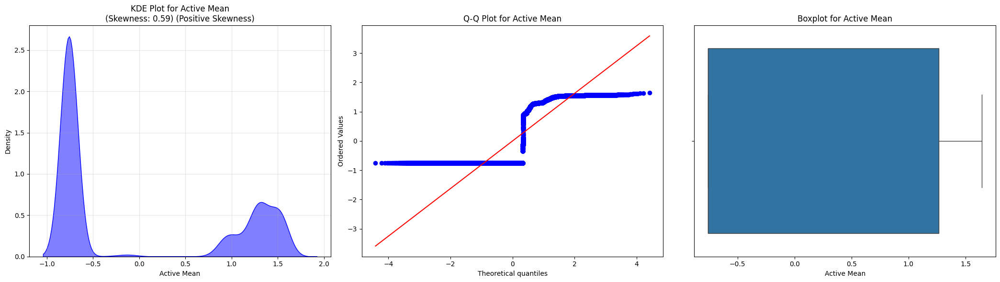

Active Std: Skewness = 4.65 (Positive Skewness)


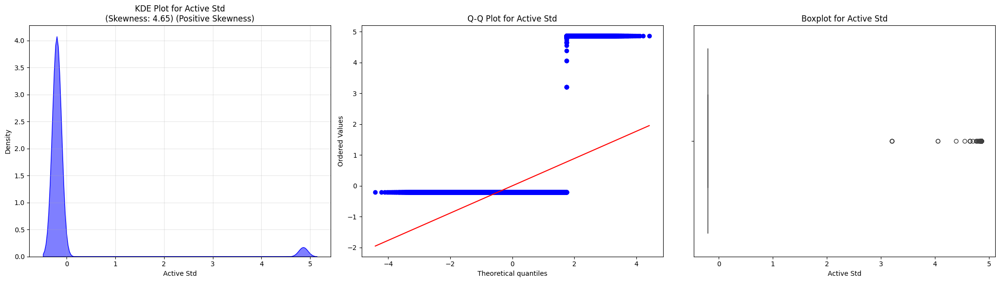

Active Max: Skewness = 0.60 (Positive Skewness)


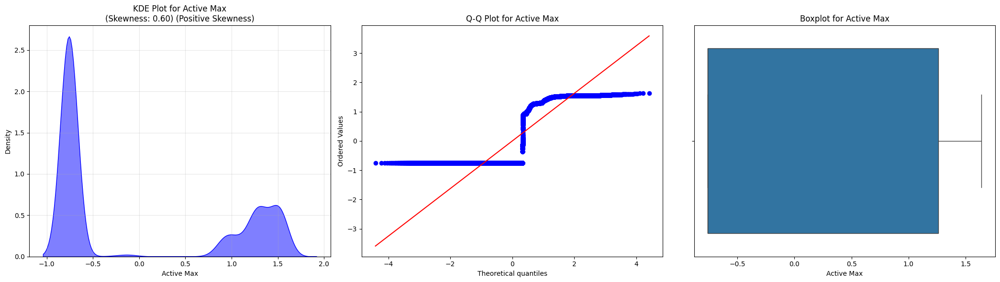

Active Min: Skewness = 0.59 (Positive Skewness)


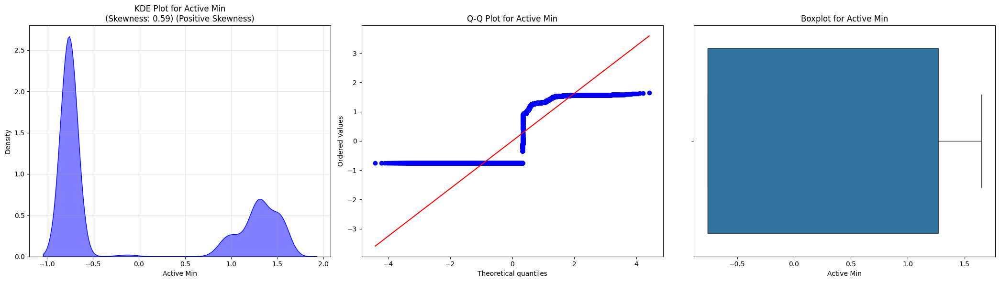

Idle Mean: Skewness = 0.53 (Positive Skewness)


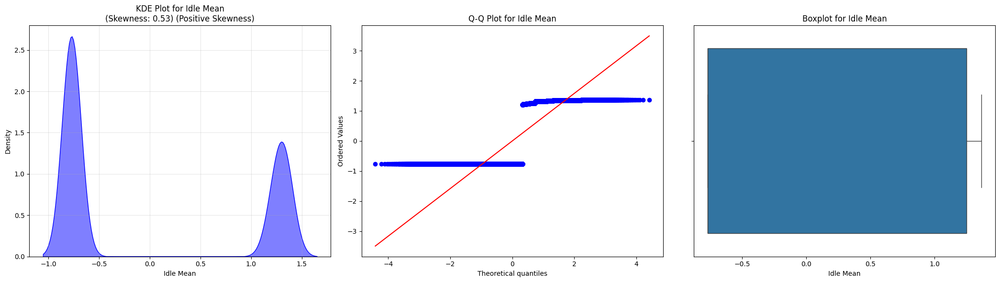

Idle Std: Skewness = 1.82 (Positive Skewness)


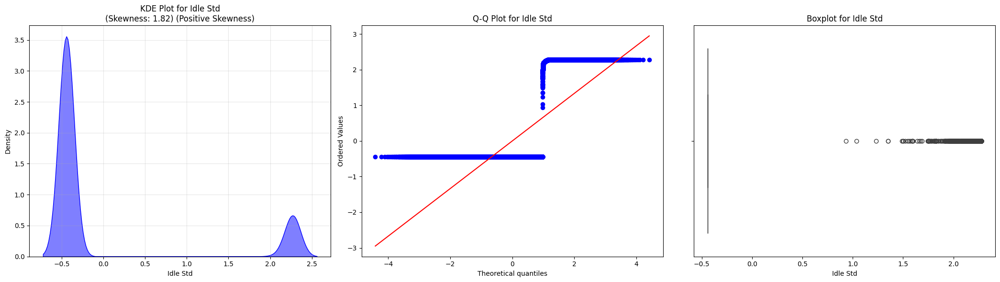

Idle Max: Skewness = 0.53 (Positive Skewness)


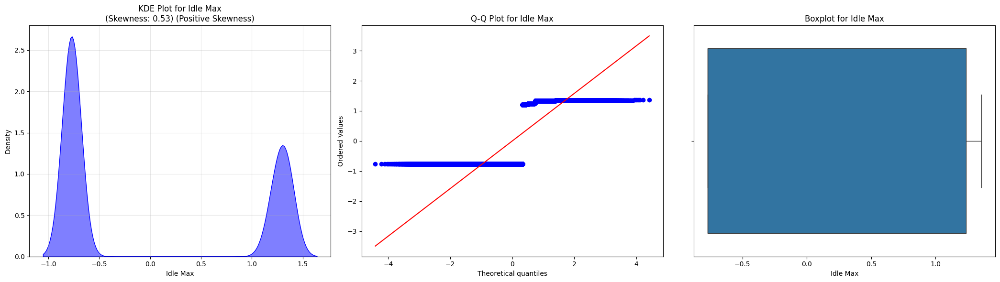

Idle Min: Skewness = 0.53 (Positive Skewness)


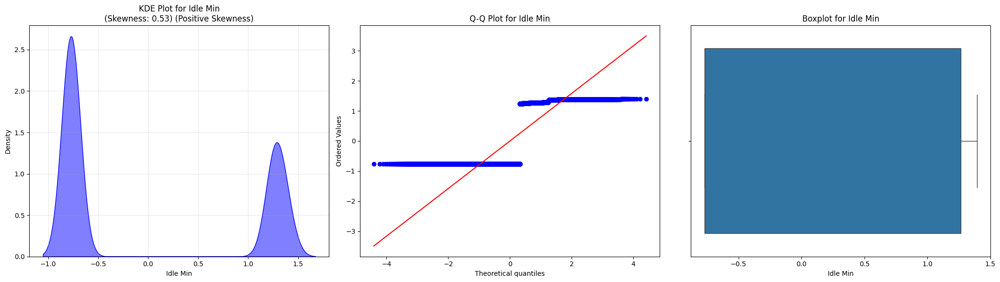

Bwd Packet Length Max: Skewness = 0.24 (Positive Skewness)


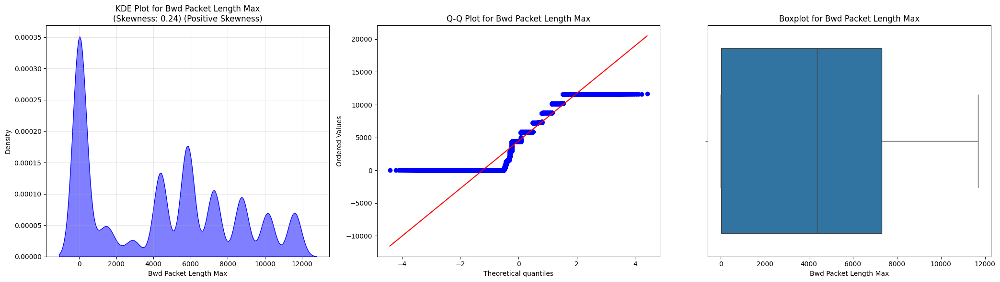

Bwd Packet Length Mean: Skewness = -0.22 (Negative Skewness)


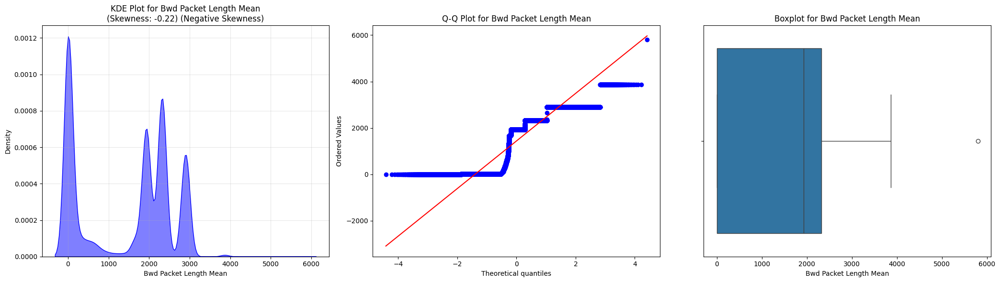

Bwd Packet Length Std: Skewness = 0.42 (Positive Skewness)


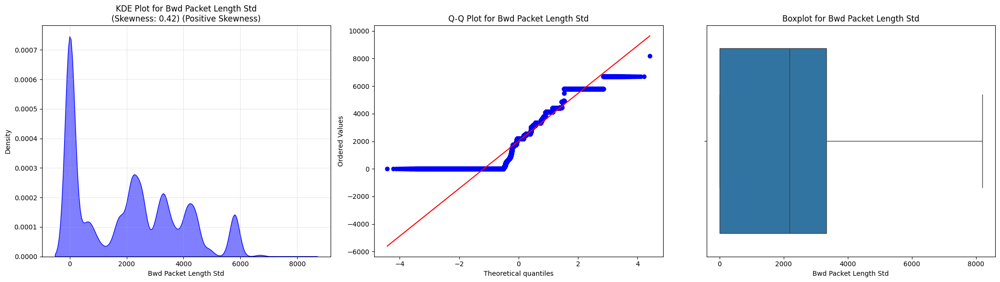

Max Packet Length: Skewness = -0.00 (Negative Skewness)


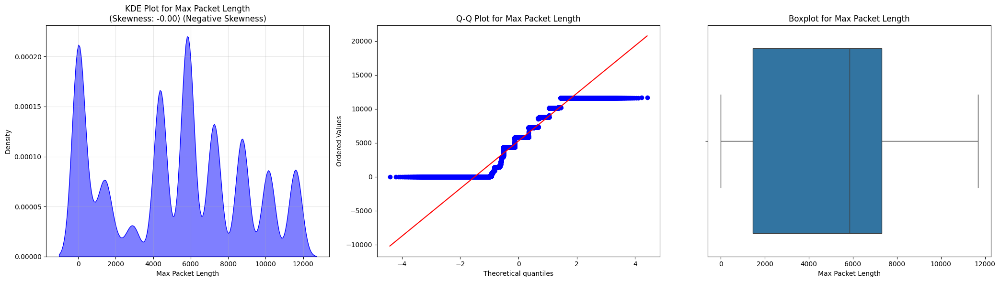

Packet Length Mean: Skewness = -0.48 (Negative Skewness)


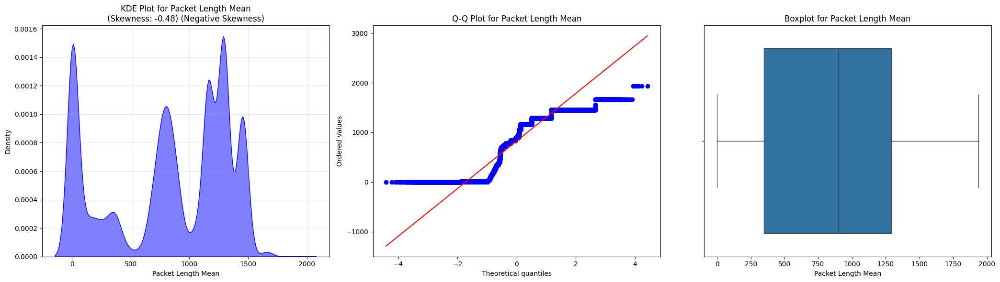

Packet Length Std: Skewness = -0.05 (Negative Skewness)


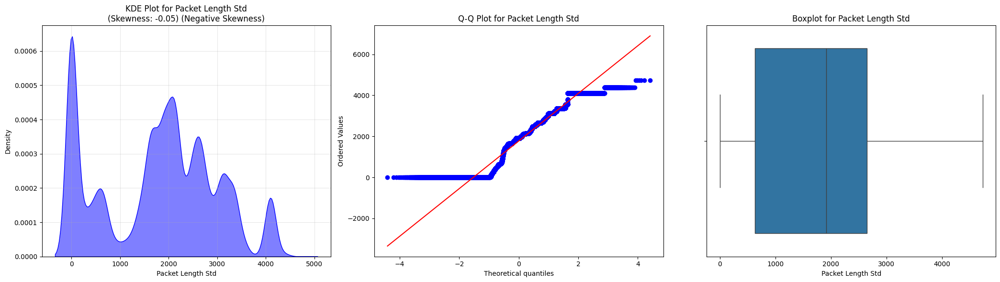

PSH Flag Count: Skewness = -0.30 (Negative Skewness)


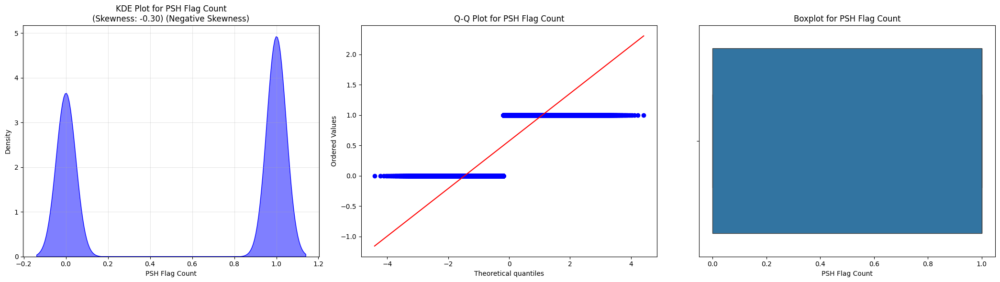

ACK Flag Count: Skewness = 0.28 (Positive Skewness)


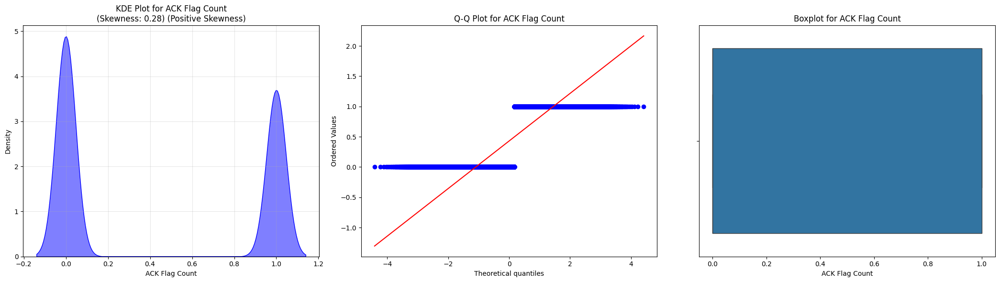

Average Packet Size: Skewness = -0.39 (Negative Skewness)


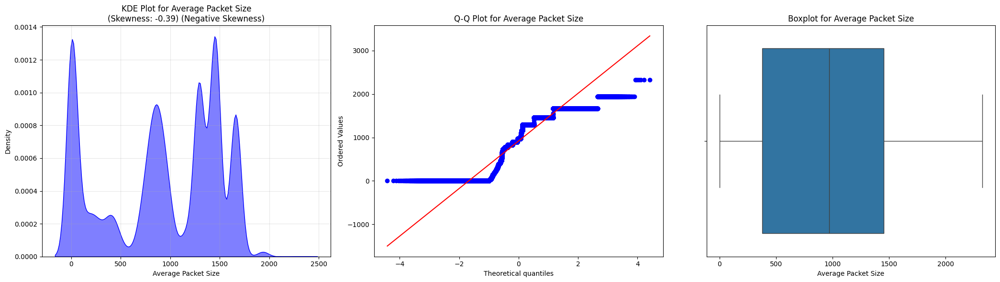

Avg Bwd Segment Size: Skewness = -0.22 (Negative Skewness)


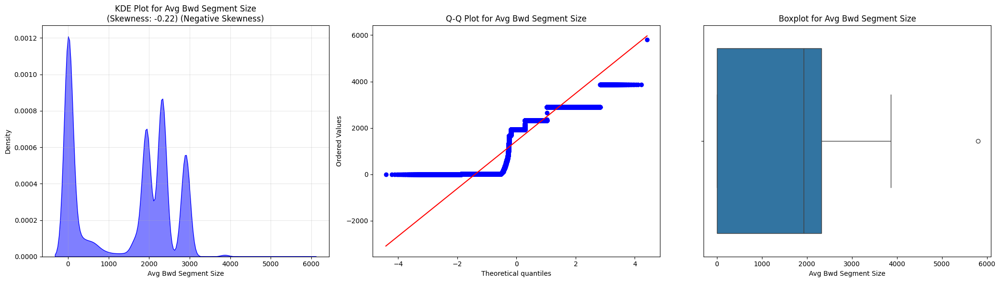

In [30]:
All_plot(transformed_X)

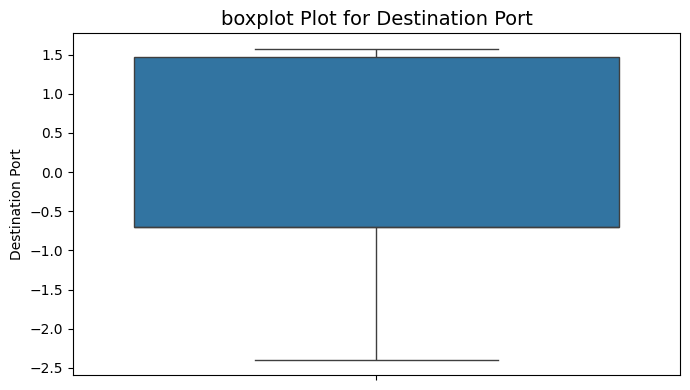

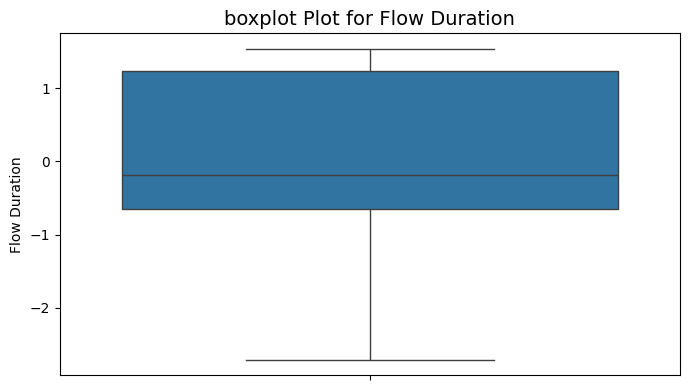

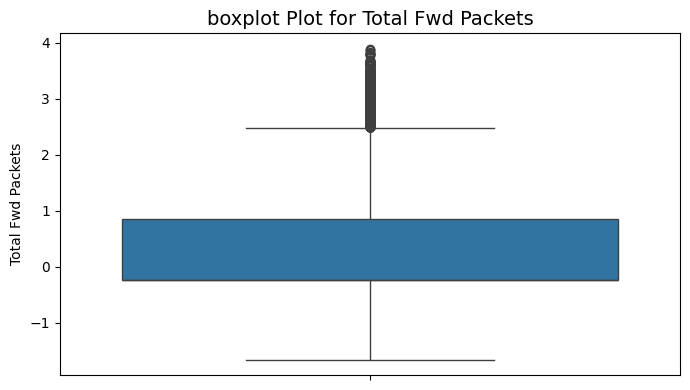

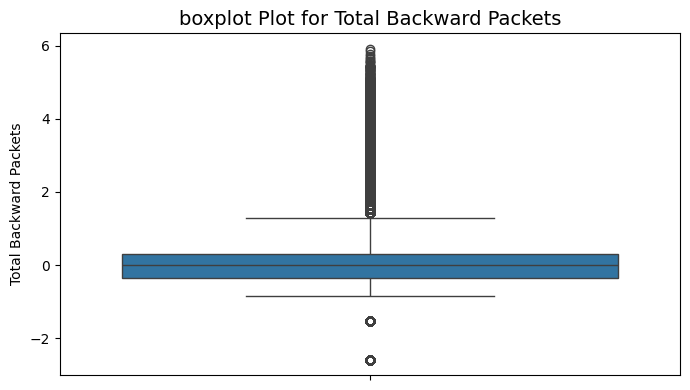

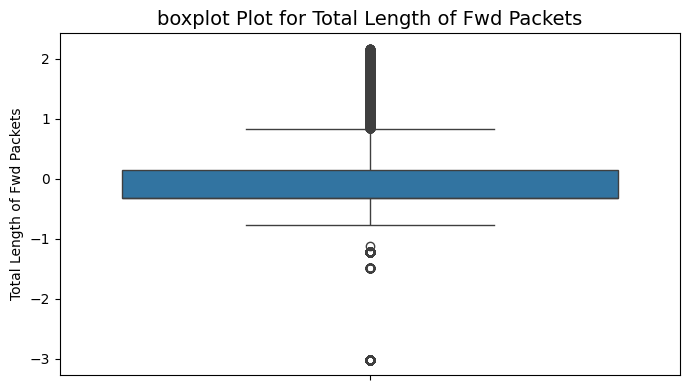

...

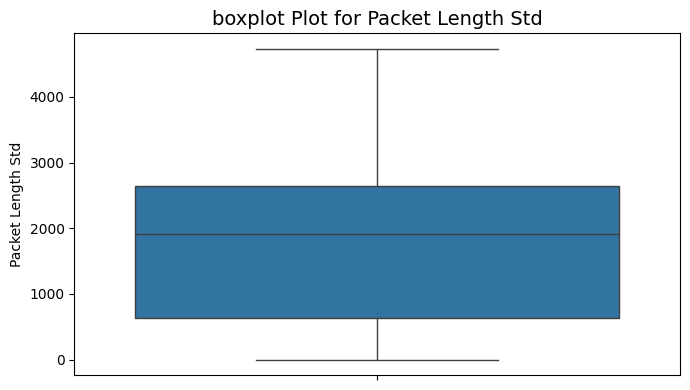

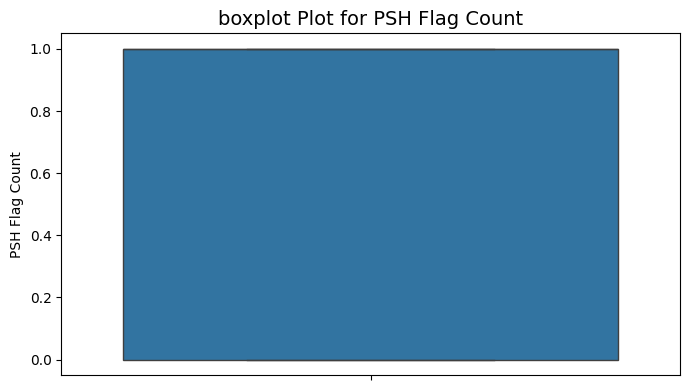

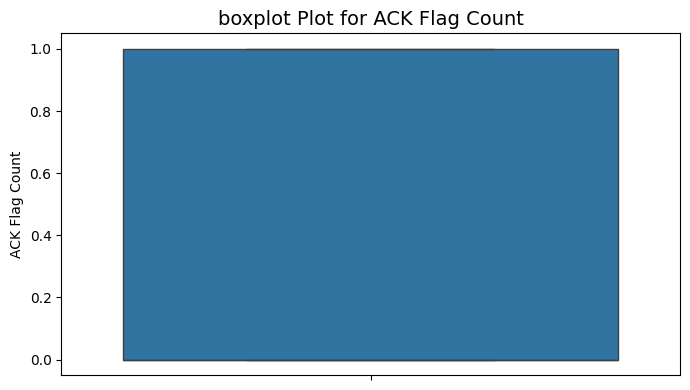

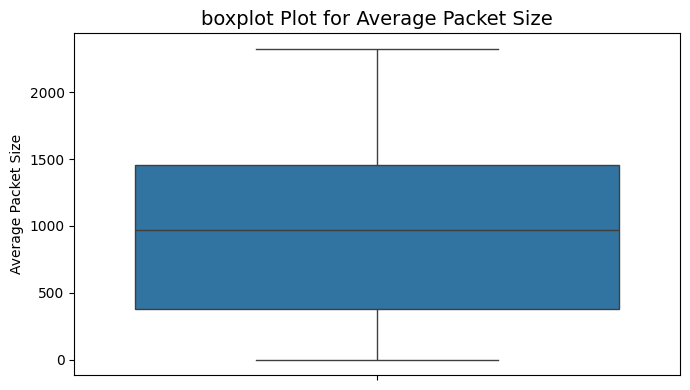

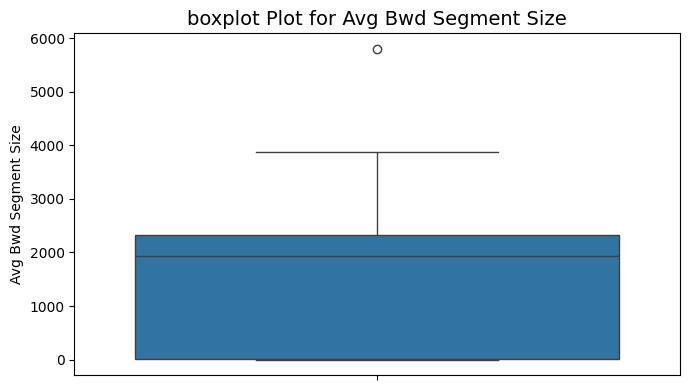

In [31]:
#detect the outlier columns and plot them 
import seaborn as sns
def outlier(X):
    # Loop through each column in the DataFrame
    for column in X.columns:
        if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
            plt.figure(figsize=(7, 4))

            # KDE plot
            sns.boxplot(X[column])
            plt.title(f"boxplot Plot for {column}", fontsize=14)

            # plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()

outlier(transformed_X)

In [32]:
def cap_outliers_iqr(df):
    df_capped = df.copy()  # Make a copy to avoid modifying the original DataFrame

    # Loop through numeric columns and cap outliers based on IQR
    for column in df_capped.select_dtypes(include=[np.number]).columns:
        Q1 = df_capped[column].quantile(0.25)
        Q3 = df_capped[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap values outside the bounds to the lower or upper bound
        df_capped[column] = np.clip(df_capped[column], lower_bound, upper_bound)

    return df_capped

X_fin = cap_outliers_iqr(transformed_X)

In [33]:
X_fin.sample(10)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Min,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,URG Flag Count,ECE Flag Count,Down/Up Ratio,Avg Fwd Segment Size,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Bwd Packet Length Max,Bwd Packet Length Mean,Bwd Packet Length Std,Max Packet Length,Packet Length Mean,Packet Length Std,PSH Flag Count,ACK Flag Count,Average Packet Size,Avg Bwd Segment Size
69129,-0.701492,-0.702013,-0.233484,0.316096,-0.318546,0.673256,-0.232129,-0.449403,-0.276692,0.040148,-0.483485,0.890152,0.862258,-0.774973,-0.676003,-0.669027,-0.587024,-0.561124,-0.569255,-0.555951,-0.568525,0.779590,-0.250168,-0.330006,-0.244077,-0.232425,-0.793712,-0.220955,-0.160354,0.280300,0.827336,0.936622,-0.406497,0.461403,-0.045681,-0.220955,-0.014022,-0.547576,-0.014022,0.761279,-0.276692,-0.233484,-0.318546,0.316096,0.673256,0.724370,0.201869,-0.117694,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,5840.0,1934.500000,2538.919278,5840.0,1163.300000,2138.329153,1.0,0.0,1292.555556,1934.500000
91735,-0.701492,-0.529741,-0.233484,0.011965,-0.318546,0.673256,-0.232129,-0.449403,-0.276692,0.040148,-0.483485,0.701340,0.570670,-0.540891,-0.486977,-0.491937,-0.354817,-0.628383,-0.644354,-0.574685,-0.613974,-0.493646,-0.077267,-0.063874,-0.022299,-0.048511,-0.595901,-0.220955,-0.160354,0.028738,0.533316,0.597200,-0.406497,0.674467,-0.045681,-0.220955,-0.014022,-0.547576,-0.014022,0.090275,-0.276692,-0.233484,-0.318546,0.011965,0.673256,0.724370,0.201869,-0.117694,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,5840.0,2321.400000,3173.373883,5840.0,1292.555556,2554.159212,1.0,0.0,1454.125000,2321.400000
49428,-0.701492,-1.102646,-0.233484,0.011965,-0.318546,0.673256,-0.232129,-0.449403,-0.276692,0.040148,-0.483485,1.390402,1.313929,-1.176907,-1.043369,-1.081370,1.251873,-0.572350,-0.581803,-0.545963,-0.570863,0.605265,-0.644418,-0.703790,-0.635826,-0.648913,0.832297,-0.220955,-0.160354,0.028738,1.382090,1.380540,-0.406497,0.674467,-0.045681,-0.220955,-0.014022,-0.547576,-0.014022,0.090275,-0.276692,-0.233484,-0.318546,0.011965,0.673256,0.724370,0.201869,-0.117694,-5.551115e-17,-0.759619,-0.205818,-0.759294,-0.759808,-0.770576,-0.441517,-0.770489,-0.770545,5840.0,2321.400000,3173.373883,5840.0,1292.555556,2554.159212,1.0,0.0,1454.125000,2321.400000
120866,1.570738,0.390993,-1.661309,0.011965,0.835392,-1.403400,-0.232129,-0.449403,0.286489,-0.708784,-0.483485,-0.699745,-0.875536,0.680332,0.559226,0.457735,-0.935913,-1.547860,-1.551885,-1.503823,-1.550422,-1.312118,0.876890,1.074830,1.062742,0.983498,-1.092223,-0.220955,-1.610819,0.028738,-1.060848,-0.781129,-0.406497,-0.559482,-0.045681,-0.220955,-0.014022,-0.547576,-0.014022,1.681428,0.286489,-1.661309,0.835392,0.011965,-1.403400,-1.156323,0.201869,-1.464181,-5.551115e-17,1.270345,-0.205818,1.262244,1.279930,1.235840,-0.441517,1.226277,1.264694,6.0,4.800000,2.683282,1375.0,396.285714,668.592730,0.0,1.0,462.333333,4.800000
135166,-0.701492,-0.572712,-0.233484,-0.365213,0.835392,-0.810052,-0.232129,-0.449403,0.286489,0.489508,-0.483485,0.053319,0.577982,-0.539751,-0.636224,-0.731249,-0.182989,0.304182,0.410826,0.412683,0.336002,1.182634,-0.309646,-0.242032,-0.235821,-0.295793,-0.449995,-0.220955

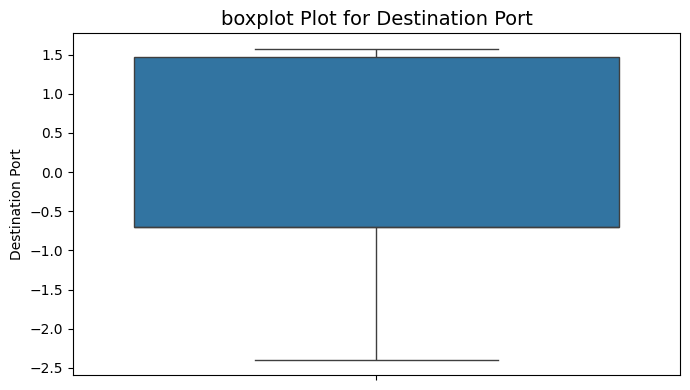

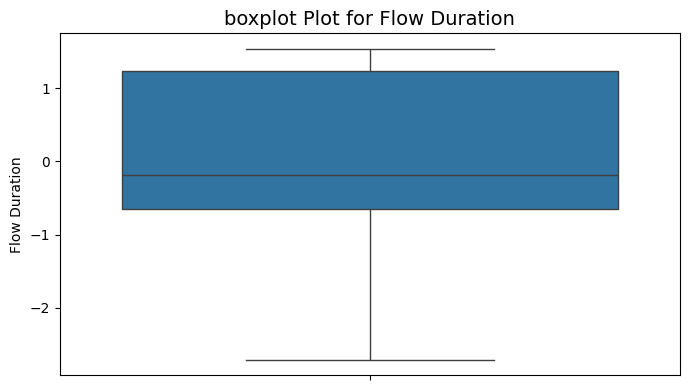

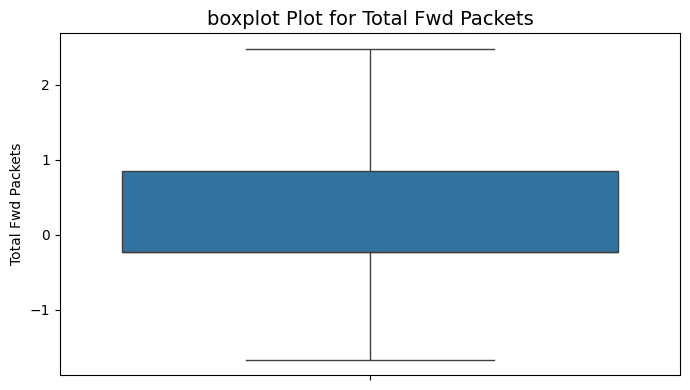

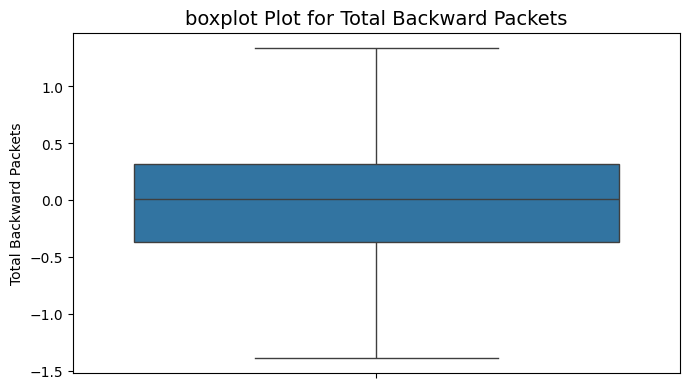

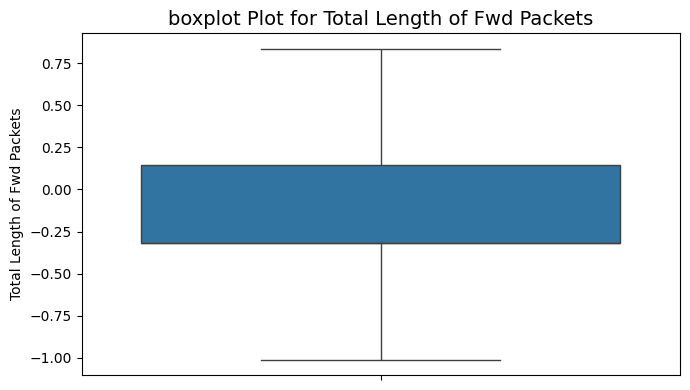

...

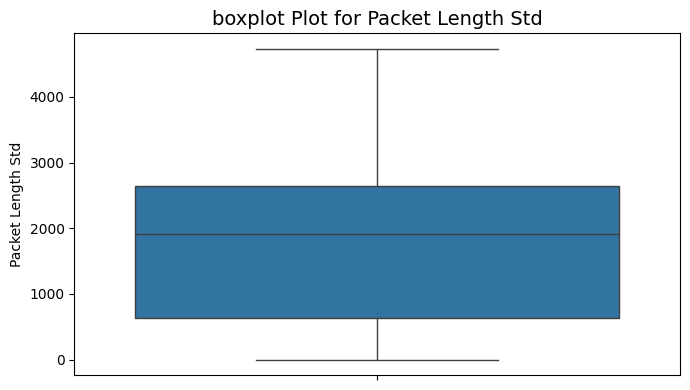

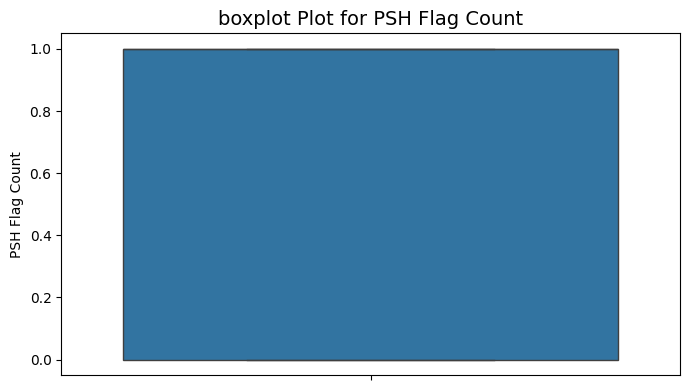

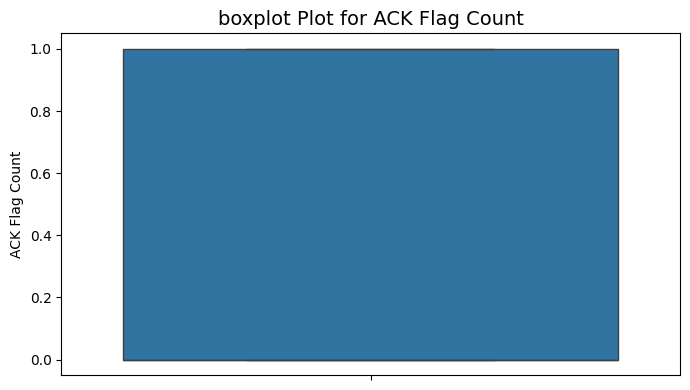

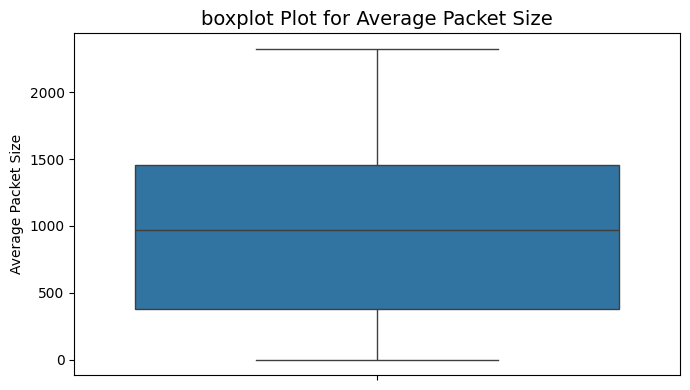

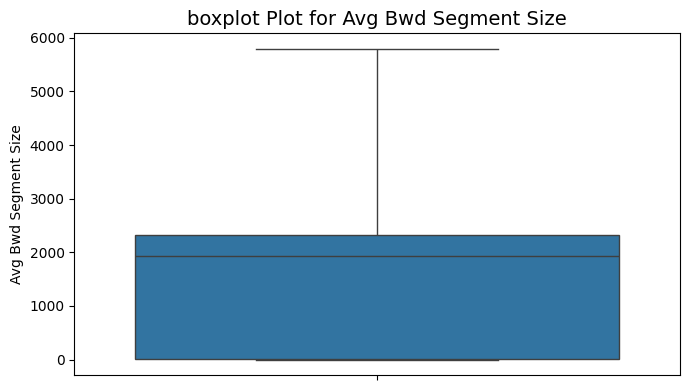

In [34]:
outlier(X_fin)

In [35]:
X_fin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137341 entries, 0 to 137340
Data columns (total 67 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Destination Port             137341 non-null  float64
 1   Flow Duration                137341 non-null  float64
 2   Total Fwd Packets            137341 non-null  float64
 3   Total Backward Packets       137341 non-null  float64
 4   Total Length of Fwd Packets  137341 non-null  float64
 5   Total Length of Bwd Packets  137341 non-null  float64
 6   Fwd Packet Length Max        137341 non-null  float64
 7   Fwd Packet Length Min        137341 non-null  float64
 8   Fwd Packet Length Mean       137341 non-null  float64
 9   Fwd Packet Length Std        137341 non-null  float64
 10  Bwd Packet Length Min        137341 non-null  float64
 11  Flow Bytes/s                 137341 non-null  float64
 12  Flow Packets/s               137341 non-null  float64
 13 

In [36]:
X_fin.shape

(137341, 67)

In [37]:
X1 = X_fin.iloc[:, 0:9]
X2 = X_fin.iloc[:, 9:18]
X3 = X_fin.iloc[:, 18:27]
X4 = X_fin.iloc[:, 27:36]
X5 = X_fin.iloc[:, 36:45]
X6 = X_fin.iloc[:, 45:54]
X7 = X_fin.iloc[:, 54:63]
X8 = X_fin.iloc[:, 63:67]

views = [X1.values, X2.values, X3.values, X4.values,
         X5.values, X6.values, X7.values, X8.values]

In [38]:
from mvlearn.embed import MCCA
mvcca = MCCA(n_components=2)
views_transformed = mvcca.fit_transform(views)

ValueError: Eigenvalue problem has a singular matrix. Add regularization (set `regs` to nonzero value) or reduce the rank (set `signal_rank` low enough).